# Trabajo Práctico 3 - Grupo 4
------------

Integrantes: 
* Francisco Insúa
* Agustina Schmidt
* Ernesto Emilio Dainesi Perrot 
* Agustina Fraccaro.

## Parte 1 – Conjunto de Datos

Ejecutamos el siguiente script de manera local para generar el subconjunto de datos utilizando el método 'sample_without_replacement'. De esta manera generamos el archivo train_data_sampled.csv el cual utilizaremos a lo largo del análisis.

In [ ]:
# import csv
# from sklearn.utils.random import sample_without_replacement

# #Obtengo el array de indices a copiar. 5531451 total de filas. 276572 5% de 5531451.
# random_state = (31416 × 4) mod 1000
# sampled_indexes = sample_without_replacement(5531451, 276572, random_state = 664 )

# #Obtengo las rutas de los archivos
# original_file = "/Users/a445953/Projects/orga-datos-tp3/train_data.csv"
# sampled_file = "/Users/a445953/Projects/orga-datos-tp3/train_data_sampled.csv"

# #Abro archivo a leer.
# with open(original_file, 'r') as csvfile:

#     #Creo archivo a escribir.
#     with open(sampled_file, 'w') as sampledfile:
        
#         #Creo el reader.
#         data_reader = csv.reader(csvfile)

#         #Creo el writer.
#         writer = csv.writer(sampledfile)
        
#         #Copio los headers del csv a leer.
#         csv_headers = next(data_reader)

#         #Los escribo en el csv nuevo.
#         writer.writerow(csv_headers)

#         #Contador de filas leidas.
#         row_readed_number = 0

#         #Contador de filas escritas.
#         row_writed_number = 0

#         #Itero sobre todas las filas del csv a leer.
#         for row in data_reader:
#             print(row_writed_number)

#             #Si el numero de fila actual se encuentra en el array de indices, lo copio.
#             if (row_readed_number in sampled_indexes):
#                 row_writed_number = row_writed_number + 1
#                 writer.writerow(row)

#             row_readed_number = row_readed_number + 1
                
#             #Si el numbero de filas escritas es igual al 5%, termino.
#             if (row_writed_number == 276572):
#                 break

## Parte 2 – Ciencia de Datos

### Librerias y Dataset

In [ ]:
!pip install -U -q PyDrive 

In [ ]:
from google.colab import files
import pandas as pd
import numpy as np
import sklearn as sk
import seaborn as sns
import scipy.stats as st
import matplotlib.pyplot as plt
import pickle
import joblib
import os
from sklearn.linear_model import LogisticRegression 
from sklearn.utils.random import sample_without_replacement
from sklearn.tree import DecisionTreeClassifier
from sklearn.preprocessing import OrdinalEncoder
from sklearn.model_selection import train_test_split, StratifiedKFold, RandomizedSearchCV
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, confusion_matrix, precision_recall_curve, roc_auc_score, recall_score, accuracy_score,f1_score, make_scorer, precision_score, roc_curve
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.ensemble import RandomForestClassifier, VotingClassifier
from sklearn.datasets import make_classification
import xgboost as xgb 
import tensorflow as tf
from tensorflow import keras
from keras.utils.vis_utils import plot_model
from sklearn.svm import LinearSVC

In [ ]:
from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive
from google.colab import auth
from oauth2client.client import GoogleCredentials

auth.authenticate_user()
gauth = GoogleAuth()
gauth.credentials = GoogleCredentials.get_application_default()
drive = GoogleDrive(gauth)

En esta sección realizamos las descargas de los datasets necesarios y los modelos previamente entrenados, que utilizaremos posteriormente en la evaluación de los mismos con el objetivo de no tener que entrenarlos nuevamente.

In [ ]:
id = '1Cn4uVZTdjjp5E0QM9HY_cdTInUNYhHJo'
downloaded = drive.CreateFile({'id': id})
downloaded.GetContentFile('train_data_sampled.csv')
dataset = pd.read_csv('train_data_sampled.csv')

In [ ]:
id = '1RLks5Tjm96Hg2pMa_OZb7E5JLOlqOmyb'
downloaded = drive.CreateFile({'id': id})
downloaded.GetContentFile('train_labels.csv')
labels = pd.read_csv('train_labels.csv')

In [ ]:
rfc_id = '14ebO5HxqN1IBqbdFeUZIOh82qgjSpM-w'
downloaded = drive.CreateFile({'id': rfc_id})
downloaded.GetContentFile('random_forest_job.joblib')

In [ ]:
xgboost_id = '1RWBcU19U-ZNWZO2r37qSRomoIb1isY-o' 
downloaded = drive.CreateFile({'id': xgboost_id})
downloaded.GetContentFile('xgboost_job.joblib')

In [ ]:
ds_merge_pickle_without_nulls_id = '1WcxKaP5FeXRSznNG7Yj_paffIPZZf8KZ' 
downloaded = drive.CreateFile({'id': ds_merge_pickle_without_nulls_id})
downloaded.GetContentFile('ds_merge_pickle.pkl')

In [ ]:
arbol_id = '11R53QSKDrKqw4J6SiwpNUVOb1MpUqlVD' 
downloaded = drive.CreateFile({'id': arbol_id})
downloaded.GetContentFile('tree_job.joblib')

In [ ]:
regresion_id = '1q8yLyzHn2iCVSBsb_x4NrYUh2gKbs0w0' 
downloaded = drive.CreateFile({'id': regresion_id})
downloaded.GetContentFile('regresion_job.joblib')

In [ ]:
svm_id = '1W8btezdMnddKe6zK0vgkpHaJjv5tom6E' 
downloaded = drive.CreateFile({'id': svm_id})
downloaded.GetContentFile('svm_job.joblib')

In [ ]:
voting_id = '1NYce96hai73KvxDSQKrMW4oJCXTaJwd-'  
downloaded = drive.CreateFile({'id': voting_id})
downloaded.GetContentFile('ensamble_voting.joblib')

In [ ]:
neural_net_id = '1Brg3FuD_PcENTGlBoQyUG3lp_LUYmi3n'  
downloaded = drive.CreateFile({'id': neural_net_id})
downloaded.GetContentFile('neural_net.joblib')

### 1. Exploración, preprocesamiento y transformación de datos

#### a) Visualización de los datos:

Primero crearemos una copia del dataset para poder trabajar sobre esa copia.

In [ ]:
ds = dataset.copy()

In [ ]:
ds.shape

(276572, 190)

Podemos ver que el dataset contiene 190 columnas y 276572 filas.

A continuación, vemos los tipos de datos que tienen las columnas y luego veremos las primeras 10 filas del dataset.

In [ ]:
ds.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 276572 entries, 0 to 276571
Columns: 190 entries, customer_ID to D_145
dtypes: float64(185), int64(1), object(4)
memory usage: 400.9+ MB


In [ ]:
ds.head(10)

,customer_ID,S_2,P_2,D_39,B_1,B_2,R_1,S_3,D_41,B_3,...,D_136,D_137,D_138,D_139,D_140,D_141,D_142,D_143,D_144,D_145
0,00000fd6641609c6ece5454664794f0340ad84dddce9a2...,2017-05-07,0.922563,0.567403,0.033713,1.007497,0.005594,0.094655,0.003162,0.010466,...,NaN,NaN,NaN,0.007742,0.002693,0.009851,NaN,0.000996,0.003254,0.004469
1,00000fd6641609c6ece5454664794f0340ad84dddce9a2...,2017-08-19,0.910458,0.032285,0.008208,1.000814,0.007448,0.120456,0.005400,0.003697,...,NaN,NaN,NaN,0.007618,0.004485,0.006807,NaN,0.007862,0.009127,0.009390
2,00007889e4fcd2614b6cbe7f8f3d2e5c728eca32d9eb8a...,2018-02-27,0.879238,0.004148,0.008522,0.813281,0.005484,NaN,0.004855,0.003961,...,NaN,NaN,NaN,0.001939,0.002953,0.007280,NaN,0.004977,0.006325,0.002059
3,000084e5023181993c2e1b665ac88dbb1ce9ef621ec537...,2017-07-12,0.779851,0.007104,0.013668,1.000452,0.009440,0.173042,0.005054,0.005158,...,NaN,NaN,NaN,0.005831,0.009525,0.005263,NaN,0.001660,0.008940,0.001482
4,000098081fde4fd64bc4d503a5d6f86a0aedc425c96f52...,2017-04-22,0.414269,0.002516,0.059667,0.123964,0.004374,0.434148,0.001405,0.052130,...,NaN,NaN,NaN,0.001986,0.004050,0.000796,NaN,0.001802,0.002364,0.003987
5,0000d17a1447b25a01e42e1ac56b091bb7cbb06317be4c...,2018-03-23,1.009762,0.006181,-0.000886,1.006692,0.006112,0.116401,0.000824,0.149496,...,NaN,NaN,NaN,0.002262,0.005217,0.002153,NaN,0.001170,0.003350,0.000675
6,00013181a0c5fc8f1ea38cd2b90fe8ad2fa8cad9d9f13e...,2017-10-17,0.424650,0.009589,0.004061,0.817873,0.000256,NaN,0.005609,0.001195,...,NaN,NaN,NaN,0.000939,0.002072,0.003534,NaN,0.002414,0.008695,0.006238
7,0001812036f1558332e5c0880ecbad70b13a6f28ab04a8...,2017-03-27,0.410251,0.006939,0.525142,0.018226,0.006648,1.607071,0.004651,0.266503,...,NaN,NaN,NaN,0.004391,0.003123,0.000386,NaN,0.007679,0.005431,0.000088
8,00018dd4932409baf6083519b52113c2ef58be59e1213e...,2017-09-20,0.955320,0.009810,0.008695,1.003955,0.001072,0.105121,0.000120,0.000754,...,NaN,NaN,NaN,0.003501,0.006806,0.001520,NaN,0.001017,0.005041,0.009361
9,00018dd4932409baf6083519b52113c2ef58be59e1213e...,2018-03-26,0.894465,0.007793,0.017898,0.812249,0.007025,0.097096,0.008311,0.009978,...,NaN,NaN,NaN,0.004283,0.006910,0.007719,NaN,0.004930,0.008561,0.004405


Podemos ver que hay 185 columnas de tipo float, 1 de tipo int y 4 de tipo object (string). La variable S_2 contiene fechas.

El dataset contiene información sobre transacciones de clientes, las features están normalizadas y son anónimas. Tienen las siguientes categorías generales:



*   D_*: variables de morosidad.
*   S_*: variables de gasto.
*   P_*: variables de pago.
*   B_*: variables de equilibrio.
*   R_*: variables de riesgo.

Las siguientes variables son categóricas: 'B_30', 'B_38', 'D_114', 'D_116', 'D_117', 'D_120', 'D_126', 'D_63', 'D_64', 'D_66', 'D_68', el resto son numéricas.

Comenzaremos viendo el porcentaje de valores nulos que tienen las columnas.

In [ ]:
tmp = ds.isna().sum().mul(100).div(len(ds)).sort_values(ascending=False)
tmp[:40]

D_87     99.929856
D_88     99.892614
D_108    99.470301
D_111    99.450414
D_110    99.450414
B_39     99.412811
D_73     99.016893
B_42     98.700881
D_134    96.498199
D_138    96.498199
D_135    96.498199
D_136    96.498199
D_137    96.498199
R_9      94.304196
B_29     93.056419
D_106    90.187004
D_132    90.163502
D_49     90.111436
R_26     89.015157
D_76     88.758443
D_66     88.725540
D_42     85.742230
D_142    83.006595
D_53     73.796697
D_82     73.385231
B_17     56.819201
D_50     56.682528
D_105    54.706912
D_56     53.971479
S_9      52.904126
D_77     45.300320
D_43     29.887335
S_27     25.326859
D_46     21.947269
S_3      18.447276
S_7      18.447276
D_62     13.678174
D_48     13.032050
D_61     10.784172
P_3       5.445598
dtype: float64

Podemos ver que hay varias columnas que poseen casi todos sus valores nulos.

A continuación, veremos cuántos customer_ID únicos hay.

In [ ]:
len(ds['customer_ID'].unique())

209228

Tenemos 209228 clientes únicos, por lo que podemos decir que algunos se repiten ya que el dataset tiene mas de 250000 filas. 

Ahora veremos cuáles son los clientes que más se repiten en el dataset y cuántas repeticiones tienen.

In [ ]:
ds.customer_ID.value_counts()[:30]

9e26759685af1dc71fef97151297411f17cf07101f4ee67d9ae43083f324a777    7
3fbcf08020eaf792086b6a5a3491fcef97ed2a129ece03da4d76fd027d5102cf    7
76f7f60e2dd07f6493ee9e21493dbeb429b568d28e2b415723594f92a25f1a67    6
7c813bd3d50afef43e2a9b7ce238cc77eea2492b41aba038440faa2c4e2ba9f9    6
2ffc8f5d490197b67fb7654a6353b5503b98898fc607d230fc363e93e9f95e41    6
748864e4dcf2660fe46b8b4b5fa4baf7d230f129d96f519e917f9b3b96113089    6
907b693db9ced089e9b2b588d0b84044092ef88f046e358b45ec7e9e24324c6f    6
989009436a848701d091dda26df4415fb43aaa1dc9698cbc0afb50d95eb7822e    5
d7781cb4e72ce35de90457f20bf626c19f947496fd8ee4ad171781014f48931d    5
86cc7a67b92581143377a64ac3b343c48d75f042e43d6492fdf6649a9be43117    5
748b52e2c99e307d5aa428d933f5ca074c3763d34cd30a883c52eb41959e4d39    5
9d2272d12d52afec31db3382edcb8f5211683c5aa760a95e313ecd359d4cdc0a    5
5b19c6e31fb50d6c914957fb0d411c3b910a87316ae962582ebd029c51d8f794    5
6fbf663c1fd0245dc9536da3a0878e40c4fe137f6c8a5554ad9dfff598d3463e    5
21b832b437870afd089f

In [ ]:
ds.customer_ID.value_counts().mean()

1.3218689659127842

Vemos que hay dos clientes que se repiten 7 veces en el dataset, 5 que se repiten 6 veces y varios más que se repiten 5.

También podemos ver que la media de repeticiones es 1.32, eso quiere decir que la mayoría de los customer_ID no se repiten.

Ahora haremos una separación de las variables según su categoría (D, S, P, B o R) para poder analizar profundamente cada una.

In [ ]:
# Creo listas con las variables de cada categoría separadas, y una con las variables categóricas.
categ = ['B_30', 'B_38', 'D_114', 'D_116', 'D_117', 'D_120', 'D_126', 'D_63', 'D_64', 'D_66', 'D_68']
tipo_D = [col for col in ds.columns if 'D_' in col]
tipo_S = [col for col in ds.columns if 'S_' in col]
tipo_P = [col for col in ds.columns if 'P_' in col]
tipo_B = [col for col in ds.columns if 'B_' in col]
tipo_R = [col for col in ds.columns if 'R_' in col]

print('Cantidad de variables de tipo D:', len(tipo_D))
print('Cantidad de variables de tipo S:', len(tipo_S))
print('Cantidad de variables de tipo P:', len(tipo_P))
print('Cantidad de variables de tipo B:', len(tipo_B))
print('Cantidad de variables de tipo R:', len(tipo_R))

Cantidad de variables de tipo D: 96
Cantidad de variables de tipo S: 22
Cantidad de variables de tipo P: 3
Cantidad de variables de tipo B: 40
Cantidad de variables de tipo R: 28


Vemos que la mayor cantidad de variables que hay en el dataset son de la categoría D (morosidad), le siguen las de tipo B (equilibrio), luego las de tipo R (riesgo), luego las S (gasto) y por último las de tipo P (pago).

**Análisis de la categoría D:**

A continuación, vemos algunos valores de las variables de la categoría D. Podemos ver que las columnas D_42, D_49, D_136, D_137, D_138 y D_142 tienen muchos valores nulos. Por otro lado, vemos que hay varias variables con valores entre 0 y 1.

In [ ]:
ds_d = ds.filter(tipo_D, axis=1)
ds_d = ds_d.drop(categ, axis=1, errors='ignore')
ds_d

,D_39,D_41,D_42,D_43,D_44,D_45,D_46,D_47,D_48,D_49,...,D_136,D_137,D_138,D_139,D_140,D_141,D_142,D_143,D_144,D_145
0,0.567403,0.003162,NaN,NaN,0.004221,0.243067,0.450481,0.384930,0.086904,NaN,...,NaN,NaN,NaN,0.007742,0.002693,0.009851,NaN,0.000996,0.003254,0.004469
1,0.032285,0.005400,NaN,NaN,0.004783,0.259658,0.436873,0.388474,0.030584,NaN,...,NaN,NaN,NaN,0.007618,0.004485,0.006807,NaN,0.007862,0.009127,0.009390
2,0.004148,0.004855,NaN,0.037001,0.006139,0.071558,0.455809,0.484715,0.243299,NaN,...,NaN,NaN,NaN,0.001939,0.002953,0.007280,NaN,0.004977,0.006325,0.002059
3,0.007104,0.005054,NaN,0.008233,NaN,0.321971,NaN,1.039918,NaN,NaN,...,NaN,NaN,NaN,0.005831,0.009525,0.005263,NaN,0.001660,0.008940,0.001482
4,0.002516,0.001405,0.154147,0.053474,0.009452,0.014236,NaN,0.002579,0.644563,NaN,...,NaN,NaN,NaN,0.001986,0.004050,0.000796,NaN,0.001802,0.002364,0.003987
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
276567,0.213786,0.003916,NaN,NaN,0.005223,0.368482,0.283666,0.524304,0.067688,NaN,...,NaN,NaN,NaN,0.006048,0.004573,0.000874,NaN,0.008773,0.002117,0.001264
276568,0.002237,0.007834,NaN,0.261274,0.000203,0.065939,0.407935,0.203242,0.015279,NaN,...,NaN,NaN,NaN,0.009965,0.007940,0.002403,NaN,0.001129,0.008662,0.007075
276569,0.536278,0.252641,NaN,0.075720,0.005637,0.110429,0.391008,0.309093,0.035508,NaN,...,NaN,NaN,NaN,0.008736,0.001692,0.005871,NaN,0.009093,0.004573,0.001100
276570,0.357424,0.417198,NaN,0.204526,0.002875,0.121003,0.504924,0.305118,0.138111,NaN,...,NaN,NaN,NaN,0.002334,0.002476,0.005321,NaN,0.001238,0.009002,0.000204


A continuación, graficaremos la cantidad de nulos que tiene cada columna de la categoría D.

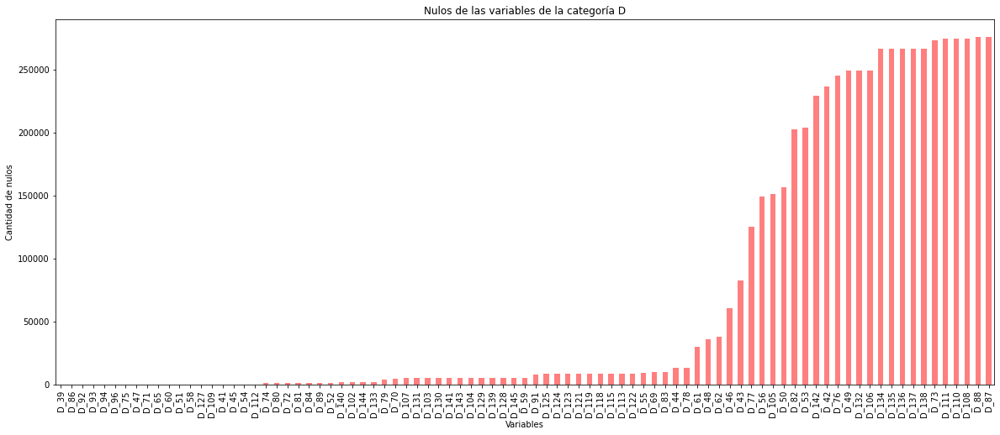

In [ ]:
plt.figure(figsize=(20,8))
ds_d.isna().sum().sort_values().plot.bar(alpha=0.5 , title="Nulos de las variables de la categoría D" , xlabel="Variables" , ylabel="Cantidad de nulos", color='red')

Podemos ver que hay varias variables con casi todos valores nulos, esto concuerda con los porcentajes de valores nulos que fueron calculados anteriormente.

A continuación, veremos la correlación lineal de las variables de la categoría entre sí, utilizando la correlación de Pearson.

El coeficiente de correlación de Pearson es una forma de medir la correlación lineal de dos variables, mide cuán relacionadas están dos variables de forma lineal de la siguiente forma:
* Correlación = 0 -> no hay correlación.
* Correlación = 1 -> correlacionadas linealmente de forma perfecta.
* Correlación = -1 -> correlacionadas lineal y negativamente de forma perfecta.

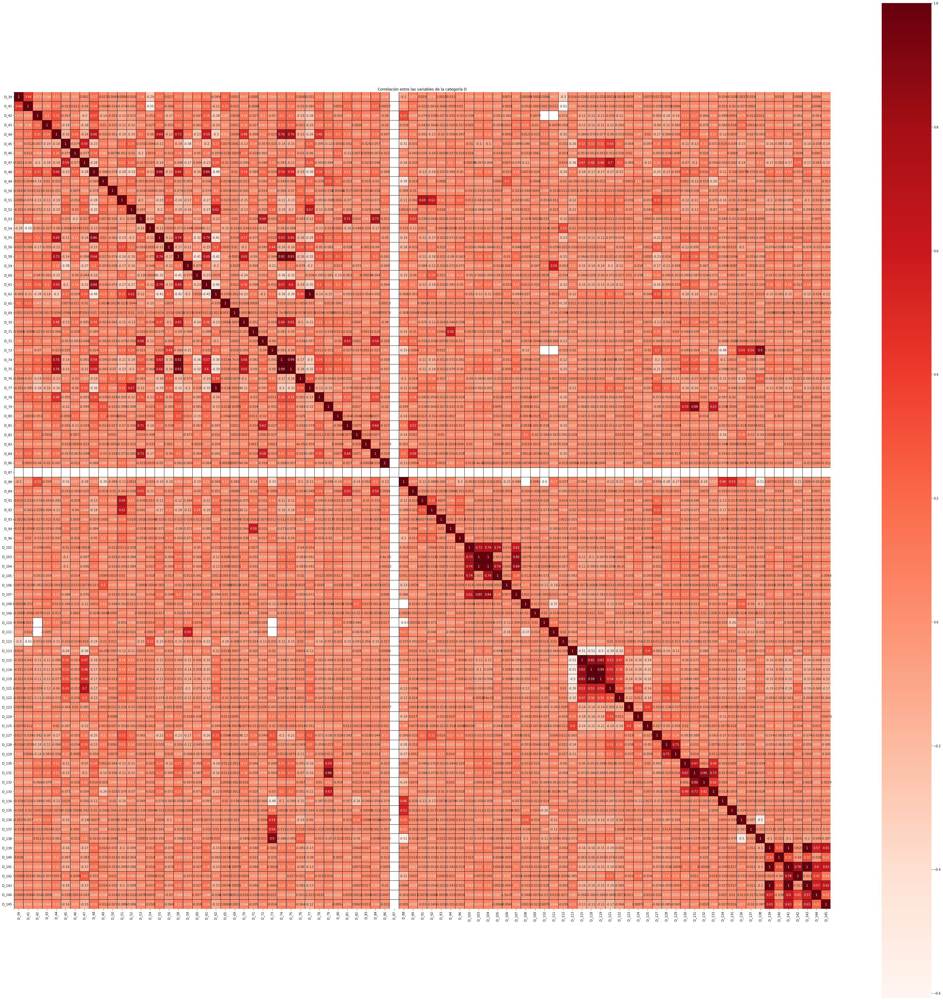

In [ ]:
pearson_corr = ds_d.corr(method='pearson')
plt.figure(figsize=(60, 60))
ax = plt.axes()
sns.heatmap(pearson_corr, cmap='Reds', linecolor='black', annot=True, linewidth=.01, square=True, ax = ax)
ax.set_title('Correlación entre las variables de la categoría D')
plt.show()

El heatmap es muy grande debido a que son 96 variables, pero se puede distinguir que donde están los colores más oscuros, esas son las correlaciones lineales más altas. Por ejemplo, podemos ver que:

*   La variable D_143 tiene correlación 1 con la D_141 y la D_139 y éstas últimas también tienen correlación 1 entre sí.
*   La variable D_138 tiene correlación 0.9 con la variable D_73.
*   La variable D_133 tiene correlación -0.72 con la variable D_68 (es la correlación más negativa).
*   La variable D_62 tiene correlación 1 con la D_77.
*   La variable D_48 tiene correlación 0.86 con la D_55.
*   La variable D_131 tiene correlación 0.88 con la D_79.
*   La variable D_75 tiene correlación 0.99 con la D_74.
*   La variable D_58 tiene correlación 0.92 con la D_74 y 0.93 con la D_75.




Por último, veremos cómo se distribuyen las variables de la categoría D.

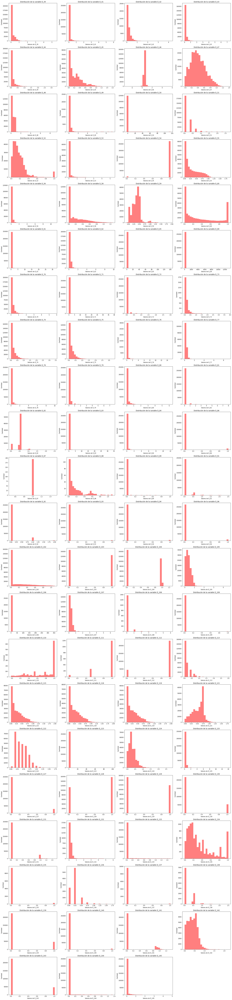

In [ ]:
plt.figure(figsize=(30,150))
for i, feature in enumerate(ds_d.columns):
  plt.subplot(24,4, i+1) 
  plt.hist(ds_d[feature], alpha = 0.5, bins=25, color='red')
  plt.xlabel('Valores de '+feature)
  plt.ylabel('Cantidad')
  plt.title('Distribución de la variable '+feature)

Realizando un análisis de los gráficos de las variables tipo 'D' podemos decir que en su gran mayoria poseen valores cercanos a 0.

**Análisis de la categoría S:**

Ahora analizaremos las variables de la categoría S. Vemos que la variable S_2 contiene fechas, la variable S_9 tiene varios valores nulos y en este caso también parecería que varias variables tienen valores entre 0 y 1.

En este caso no dropeamos columnas categóricas como hicimos con la categoría D porque no hay variables categóricas que pertenezcan a S

In [ ]:
ds_s = ds.filter(like='S_', axis=1) 
ds_s

,S_2,S_3,S_5,S_6,S_7,S_8,S_9,S_11,S_12,S_13,...,S_17,S_18,S_19,S_20,S_22,S_23,S_24,S_25,S_26,S_27
0,2017-05-07,0.094655,0.011832,0.007552,0.083990,0.666716,NaN,0.408506,0.181359,0.428290,...,0.002065,0.006893,0.000952,0.002703,0.939467,0.133085,0.934993,0.978863,0.001987,0.005694
1,2017-08-19,0.120456,0.003458,0.000920,0.095494,0.325600,0.017112,0.285843,0.094935,0.001241,...,0.002622,0.008305,0.005471,0.006480,0.847383,0.138173,0.844893,0.976287,0.005850,0.307084
2,2018-02-27,NaN,0.008466,1.006930,NaN,0.002761,NaN,0.287433,0.192370,0.001280,...,0.000026,0.001105,0.000208,0.004838,0.297848,0.131971,0.082801,0.976998,0.009451,NaN
3,2017-07-12,0.173042,0.008627,0.001355,0.190411,0.323970,NaN,0.482991,0.192871,0.002469,...,0.003775,0.001431,0.001052,0.003176,0.850648,0.133897,0.841714,0.973566,0.001104,0.000398
4,2017-04-22,0.434148,0.012618,0.001266,0.370878,0.330364,NaN,0.327062,0.087418,0.000233,...,0.007470,0.003488,0.000784,0.006150,0.926725,0.136514,0.915953,0.978848,0.000295,0.002087
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
276567,2017-12-25,0.140585,0.009820,0.005806,0.098271,0.600909,NaN,0.289042,0.187185,0.289115,...,0.004922,0.007046,0.001809,0.006294,0.913663,0.134554,0.912639,0.970776,0.006372,0.003369
276568,2017-09-09,0.140112,0.275520,0.009312,0.094025,0.492496,NaN,0.201147,0.312689,0.429548,...,0.077506,0.009876,0.007510,0.009055,0.959130,0.135178,0.968427,0.977798,0.055105,0.006036
276569,2017-03-16,0.084054,0.085362,0.003311,0.082324,0.924355,0.037045,0.404293,0.448750,0.508698,...,0.000204,0.005883,0.003417,0.005545,0.935242,0.130893,0.950554,0.975770,0.005848,0.380498
276570,2017-06-10,0.096557,0.131365,0.002052,0.079219,0.705103,0.023533,0.480411,0.222755,0.507595,...,0.006185,0.006207,0.007103,0.002821,0.952727,0.134063,0.964885,0.973797,0.007264,0.352329


Ahora graficaremos la cantidad de nulos de las columnas de la categoría S.

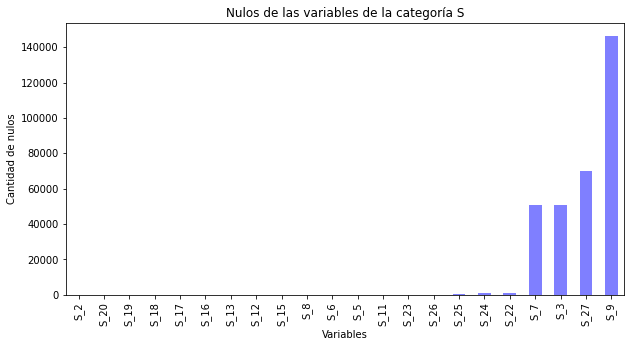

In [ ]:
plt.figure(figsize=(10,5))
ds_s.isna().sum().sort_values().plot.bar(alpha=0.5 , title="Nulos de las variables de la categoría S" , xlabel="Variables" , ylabel="Cantidad de nulos", color='blue')

Podemos ver que la mayoría de las variables de la categoría S no tiene valores nulos, y hay una (S_9) que tiene casi todos valores nulos.

A continuación, veremos la correlación lineal entre las variables de esta categoría, usando la correlación de Pearson, tal como se hizo con la categoría D.

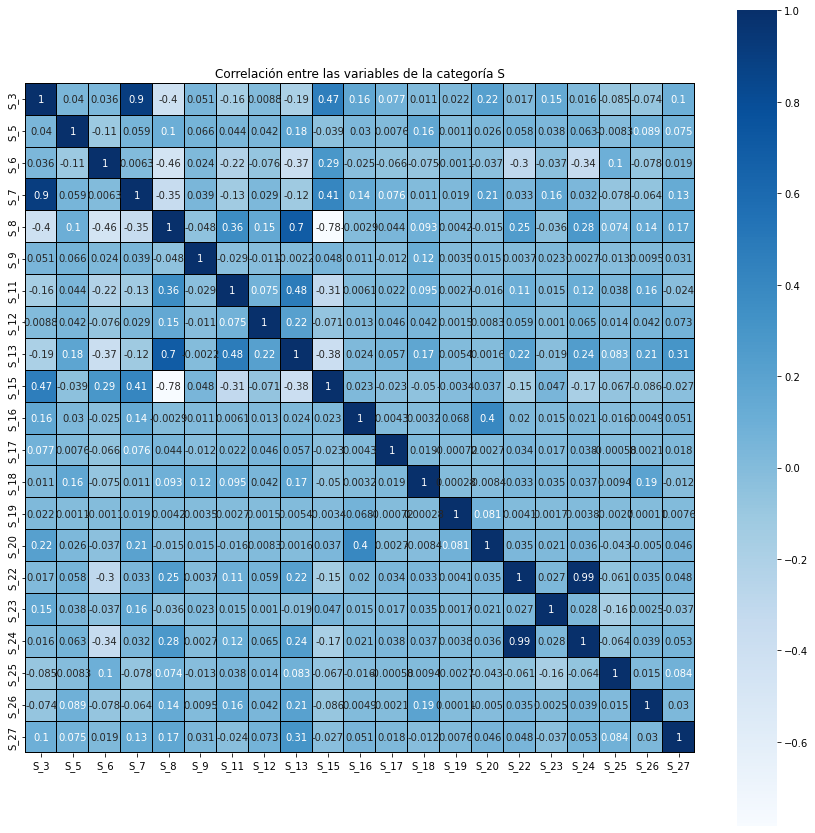

In [ ]:
pearson_corr = ds_s.corr(method='pearson')
plt.figure(figsize=(15,15))
ax = plt.axes()
sns.heatmap(pearson_corr, cmap='Blues', linecolor='black', annot=True, linewidth=.01, square=True, ax=ax)
ax.set_title('Correlación entre las variables de la categoría S')
plt.show()

Podemos ver que:
* Las variables S_22 y S_24 tienen correlación de valor 0.99.
* Las variables S_7 y S_3 tienen correlación de valor 0.9.
* Las variables S_15 y S_8 tienen correlación de valor -0.78 (la más negativa).

A continuación, veremos la distribución de cada variable de la categoría.

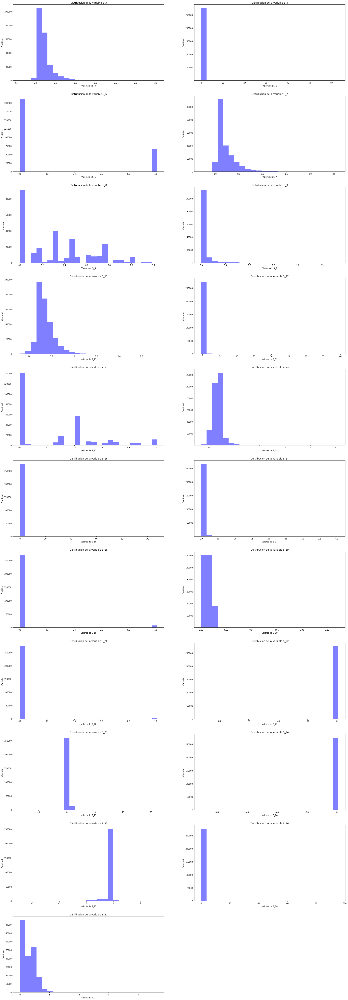

In [ ]:
ds_s_hist = ds_s.drop('S_2', axis=1, errors='ignore')
plt.figure(figsize=(30,100))
for i, feature in enumerate(ds_s_hist.columns):
  plt.subplot(12,2, i+1) 
  plt.hist(ds_s_hist[feature], alpha = 0.5, bins=25, color='blue')
  plt.xlabel('Valores de '+feature)
  plt.ylabel('Cantidad')
  plt.title('Distribución de la variable '+feature)
    

Realizando un análisis de los gráficos de las variables tipo 'S', vemos que en su mayoria tienen valores cercanos a 0, a excepción de algunas variables que poseen valores no continuos como 'S_8' o 'S_13', o 'S_6' que varia entre valores cercanos a 0 y 1.

Por último, veremos por separado la variable `S_2`, que como dijimos anteriormente, contiene fechas.

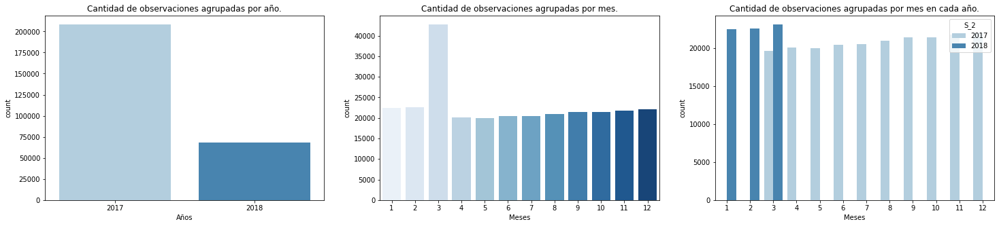

In [ ]:
plt.figure(figsize=(25,5))
ds_s_plot = ds_s.copy()
ds_s_plot['S_2'] = pd.to_datetime(ds_s['S_2'])

plt.subplot(1, 3, 1)
sns.countplot(x=ds_s_plot['S_2'].dt.year, palette='Blues')
plt.xlabel('Años')
plt.title('Cantidad de observaciones agrupadas por año.')

plt.subplot(1, 3, 2)
sns.countplot(x=ds_s_plot['S_2'].dt.month, palette='Blues')
plt.xlabel('Meses')
plt.title('Cantidad de observaciones agrupadas por mes.')

plt.subplot(1, 3, 3)
sns.countplot(x=ds_s_plot['S_2'].dt.month, hue=ds_s_plot['S_2'].dt.year, palette='Blues')
plt.xlabel('Meses')
plt.title('Cantidad de observaciones agrupadas por mes en cada año.')

plt.show()

Vemos en el gráfico de la izquierda que la información fue tomada únicamente de los años 2017 y 2018, siendo del 2017 su mayoría. 

Mientras que en el gráfico del medio, vemos que el mes 3 (marzo) es el que tiene la mayor cantidad de apariciones, mientras que el resto de los meses tienen una cantidad de apariciones muy similar.

Por último, en el gráfico de la derecha vemos que en el año 2018 solo se computan observaciones en los 3 primeros meses (enero, febrero y marzo), mientras que en el año 2017 se computan en todos los meses menos en los dos primeros (enero y febrero).

**Análisis de la categoría B:**

Pasamos a ver las de la categoría B. Vemos que B_39 y B_42 tienen muchos valores nulos, B_31 tiene en su mayoría el valor 1. 

In [ ]:
ds_b = ds.filter(like='B_', axis=1)
ds_b = ds_b.drop(categ, axis=1, errors='ignore')
ds_b

,B_1,B_2,B_3,B_4,B_5,B_6,B_7,B_8,B_9,B_10,...,B_29,B_31,B_32,B_33,B_36,B_37,B_39,B_40,B_41,B_42
0,0.033713,1.007497,0.010466,0.015447,0.031776,0.191490,0.034360,0.006907,0.010246,0.296058,...,NaN,1,0.002534,1.002241,0.008267,0.041172,NaN,0.023568,0.007655,NaN
1,0.008208,1.000814,0.003697,0.009432,0.165146,0.211603,0.015836,0.009010,0.001722,0.299325,...,NaN,1,0.005509,1.003758,0.005325,0.011361,NaN,0.013852,0.005587,NaN
2,0.008522,0.813281,0.003961,0.284587,0.005731,0.054377,0.164024,1.000759,0.009553,0.124556,...,NaN,1,0.005008,1.004277,0.009517,0.004803,NaN,0.131220,0.003136,NaN
3,0.013668,1.000452,0.005158,0.006723,0.003175,0.197309,0.008004,0.003459,0.013029,0.297752,...,NaN,1,0.000364,1.000240,0.009640,0.015367,NaN,0.002038,0.006242,NaN
4,0.059667,0.123964,0.052130,0.033592,0.005730,0.036248,0.075235,0.999782,0.637089,0.041365,...,NaN,1,0.002279,0.002065,0.005973,0.062067,NaN,0.156204,0.007997,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
276567,0.043705,0.819672,0.003870,0.020932,0.009896,0.209360,0.037405,0.003760,0.010193,0.295437,...,NaN,1,0.005590,1.000259,0.004876,0.048683,NaN,0.013912,0.004155,NaN
276568,0.028992,1.003776,0.002409,0.041372,0.101418,0.292941,0.024615,1.002738,0.141182,0.453770,...,NaN,1,0.004082,1.009366,0.009008,0.030113,NaN,0.018824,0.008865,NaN
276569,0.063875,1.008807,0.003013,0.038880,0.049906,0.200270,0.042889,1.004083,0.111800,0.301922,...,NaN,1,0.004948,1.003454,0.001177,0.059920,NaN,0.035101,0.000377,NaN
276570,0.054416,1.001626,0.154852,0.030182,0.244599,0.208180,0.035397,1.000943,0.138689,0.294502,...,NaN,1,0.002882,1.005912,0.004060,0.052590,NaN,0.011594,0.001106,NaN


Graficamos la cantidad de nulos que tienen las variables de la categoría B.

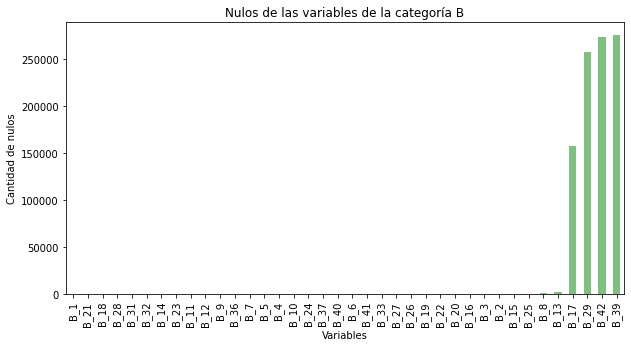

In [ ]:
plt.figure(figsize=(10,5))
ds_b.isna().sum().sort_values().plot.bar(alpha=0.5 , title="Nulos de las variables de la categoría B" , xlabel="Variables" , ylabel="Cantidad de nulos", color='green')

Acá también podemos ver que la mayoría de las variables de la categoría no tienen valores nulos. Por el contrario, hay 3 que tienen casi todos los valores nulos (B_39, B_42 y B_29).

Graficamos la correlación lineal de las variables, usando una vez más la correlación de Pearson.

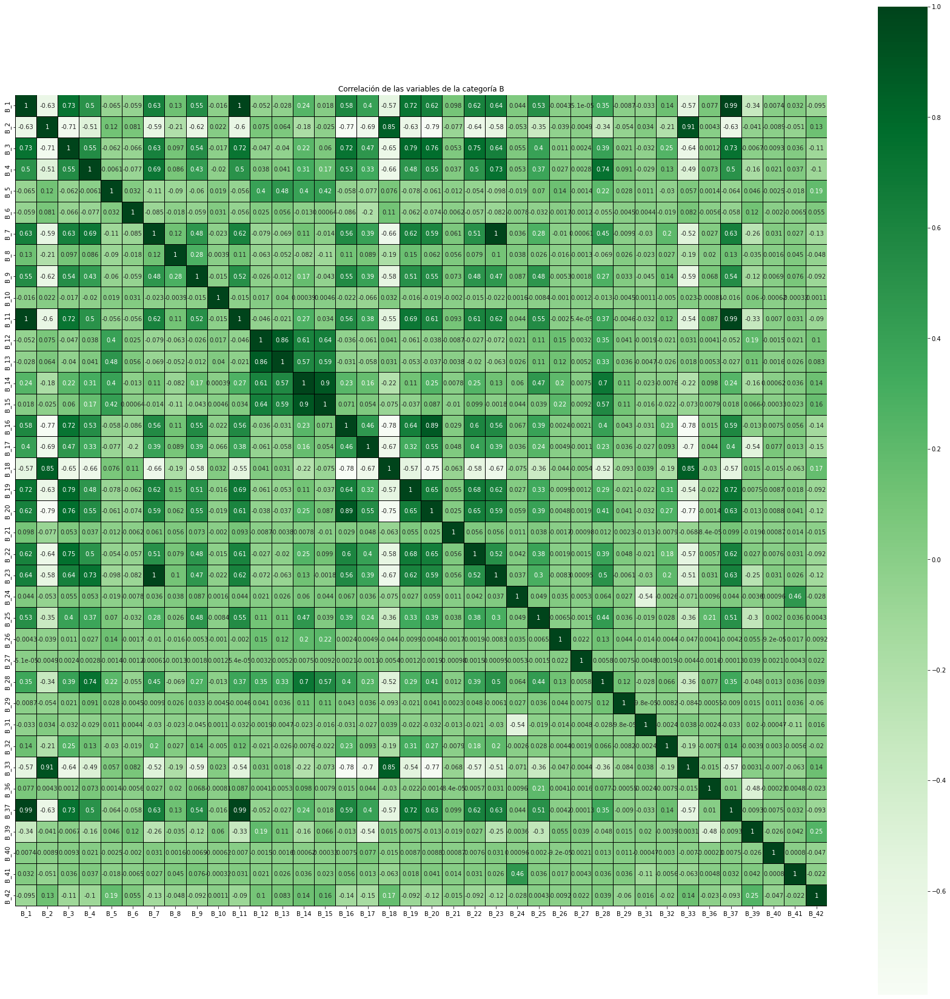

In [ ]:
pearson_corr = ds_b.corr(method='pearson')
plt.figure(figsize=(30,30))
ax = plt.axes()
sns.heatmap(pearson_corr, cmap='Greens', linecolor='black', annot=True, linewidth=.01, square=True, ax = ax)
ax.set_title('Correlación de las variables de la categoría B')
plt.show()

Podemos ver que:
* La variable B_1 tiene correlación 1 con la B_11.
* La variables B_37 tene correlación 0.99 con la B_1 y con la B_11.
* La variable B_3 tiene correlación 0.91 con la B_2.
* La variable B_14 tiene correlación 0.9 con la B_15.
* La variable B_20 tiene correlación -0.79 con la B_2.
* La variable B_18 tiene correlación -0.78 con la B_16.
* La variable B_2 tiene correlación -0.77 con la B_16.

Por último, graficaremos las distribuciones de las variables de la categoría utilizando histogramas.

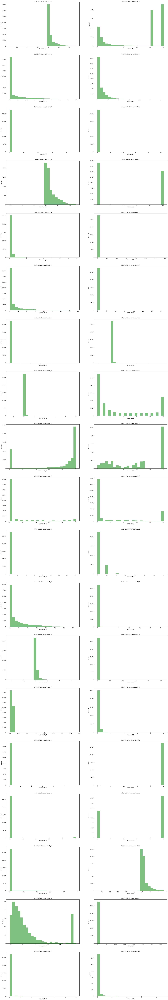

In [ ]:
plt.figure(figsize=(30,200))
for i, feature in enumerate(ds_b.columns):
  plt.subplot(20,2, i+1) 
  plt.hist(ds_b[feature], alpha = 0.5, color='green', bins=25)
  plt.xlabel('Valores de '+feature)
  plt.ylabel('Cantidad')
  plt.title('Distribución de la variable '+feature)

Realizando un análisis de los gráficos de las variables tipo 'B', nuevamente podemos ver que los valores rondan entre 0 y 1.

**Análisis de la categoría P:**

Ahora vemos la categoría P. La variable P_2 parece tener algunos valores cercanos a 1. No se aprecia que alguna variable tenga muchos valores nulos.

In [ ]:
ds_p = ds.filter(like='P_', axis=1)
ds_p

,P_2,P_3,P_4
0,0.922563,0.597797,0.003788
1,0.910458,0.563508,0.005434
2,0.879238,0.570001,0.002815
3,0.779851,0.586999,0.000042
4,0.414269,NaN,0.959851
...,...,...,...
276567,0.888192,0.687589,0.006710
276568,0.895553,0.786104,0.008739
276569,0.793724,0.680942,0.007256
276570,0.768016,0.589789,0.007543


Graficamos la cantidad de nulos de las variables de la categoría P.

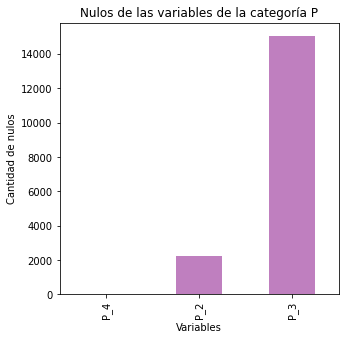

In [ ]:
plt.figure(figsize=(5,5))
ds_p.isna().sum().sort_values().plot.bar(alpha=0.5 , title="Nulos de las variables de la categoría P" , xlabel="Variables" , ylabel="Cantidad de nulos", color='purple')

Podemos ver que la variable P_4 no tiene nulos, la P_2 tiene unos pocos y la P_3 es la que más tiene, aunque en relación con la cantidad de filas, no es mucho ya que en este gráfico nos muestran como valor máximo 14.000 y hay más de 200.000 filas.

Graficamos la correlación lineal de las variables, usando la correlación de Pearson.

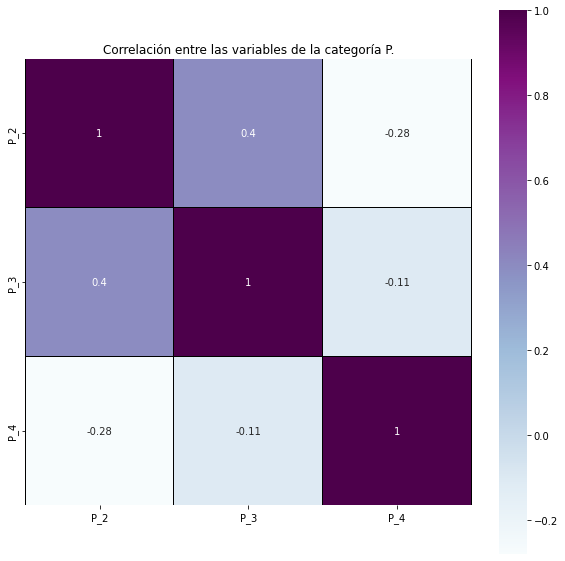

In [ ]:
pearson_corr = ds_p.corr(method='pearson')
plt.figure(figsize=(10,10))
ax = plt.axes()
sns.heatmap(pearson_corr, cmap='BuPu', linecolor='black', annot=True, linewidth=.01, square=True, ax = ax)
ax.set_title('Correlación entre las variables de la categoría P.')
plt.show()

Vemos que las variables de esta categoría no tienen correlaciones muy altas (ni positivas ni negativas).

Por último, graficaremos las distribuciones de las variables de la categoría utilizando histogramas.

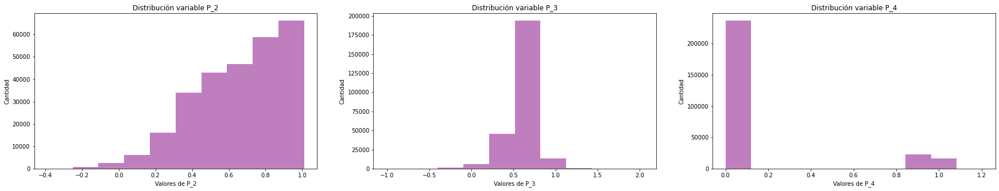

In [ ]:
plt.figure(figsize=(30,5))
for i, feature in enumerate(ds_p.columns):
  plt.subplot(1, 3, i+1) 
  plt.hist(ds_p[feature], alpha = 0.5, color='purple')
  plt.xlabel('Valores de '+feature)
  plt.ylabel('Cantidad')
  plt.title('Distribución variable '+feature)

**Análisis de la categoría R:**

Por último, analizamos la categoría R. Vemos que tanto la columna R_9 como la R_26 tiene mayoría de valores nulos y la R_27 tiene en su mayoría valores muy cercanos a 1.

In [ ]:
ds_r = ds.filter(like='R_', axis=1)
ds_r

,R_1,R_2,R_3,R_4,R_5,R_6,R_7,R_8,R_9,R_10,...,R_19,R_20,R_21,R_22,R_23,R_24,R_25,R_26,R_27,R_28
0,0.005594,0.008117,0.002729,0.004912,0.005254,0.004799,0.003067,0.005586,NaN,0.007756,...,0.001200,0.003717,0.009305,0.003114,0.001053,0.006077,0.003896,NaN,1.002329,0.002501
1,0.007448,0.007773,0.000876,0.007506,0.009826,0.009075,0.007153,0.008779,NaN,0.003979,...,0.005134,0.009186,0.000526,0.000586,0.003145,0.000148,0.005582,NaN,1.009612,0.006524
2,0.005484,0.002636,0.007358,0.005195,0.007350,0.000626,0.001414,0.000962,NaN,0.005402,...,0.001196,0.009211,0.006099,0.009683,0.005074,0.009874,0.000453,NaN,1.005203,0.002415
3,0.009440,0.007750,0.005908,0.005503,0.001672,0.005897,0.004411,0.005094,NaN,0.001992,...,0.001488,0.002430,0.002218,0.005970,0.009817,0.004095,0.000620,NaN,1.002432,0.007086
4,0.004374,0.009938,0.205620,0.007582,0.003993,0.002014,0.005908,0.008094,NaN,0.001713,...,0.006262,0.003190,0.002937,0.007475,0.008911,0.003947,0.007408,NaN,1.007585,0.004508
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
276567,0.000422,0.000254,0.001759,0.001685,0.007311,0.006159,0.001321,0.008039,NaN,0.000070,...,0.006098,0.000935,0.003466,0.009108,0.008281,0.005943,0.007909,NaN,1.009854,0.003071
276568,0.006711,0.001307,0.101357,0.009559,0.009084,0.007135,0.005453,0.009670,NaN,0.004940,...,0.001121,0.003233,0.003098,0.003457,0.007776,0.005388,0.006742,NaN,1.001093,0.002609
276569,0.007620,0.009095,0.004628,0.003162,0.006588,0.002203,0.000907,0.003164,NaN,0.009404,...,0.007536,0.003278,0.009172,0.000667,0.007134,0.007842,0.006471,NaN,1.003197,0.000672
276570,0.003978,0.004716,0.209167,0.002501,0.001504,0.009183,0.008156,0.002252,NaN,0.008904,...,0.001436,0.003327,0.009797,0.004569,0.005946,0.004074,0.004548,NaN,1.000960,0.007642


Graficamos la cantidad de valores nulos de las variables de la categoría R.

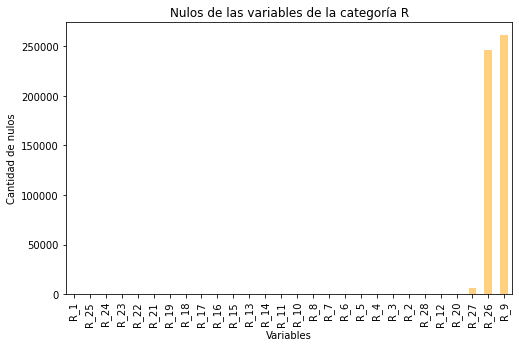

In [ ]:
plt.figure(figsize=(8,5))
ds_r.isna().sum().sort_values().plot.bar(alpha=0.5 , title="Nulos de las variables de la categoría R" , xlabel="Variables" , ylabel="Cantidad de nulos", color='orange')

Acá vemos que también la mayoría de las variables de la categoría no tienen valores nulos, solamente hay 2 que los tienen en su mayoría.

A continuación, graficamos la correlación lineal de las variables, usando también la correlación de Pearson.

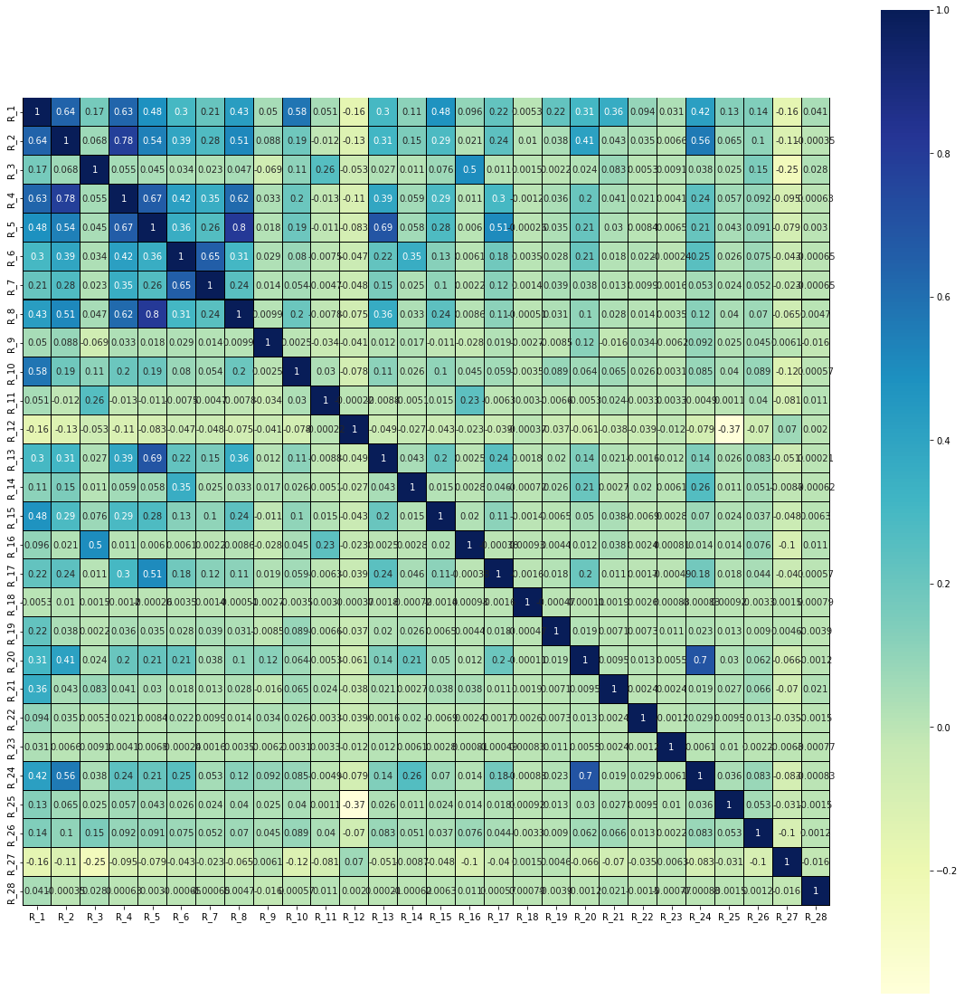

In [ ]:
pearson_corr = ds_r.corr(method='pearson')
plt.figure(figsize=(20,20))
sns.heatmap(pearson_corr, cmap='YlGnBu', linecolor='black', annot=True, linewidth=.01, square=True)

En esta categoría podemos ver que no tenemos muchas correlaciones altas, las más altas son:
* La variable R_8 con R_5 con un valor de 0.8
* La variable R_4 con la R_2 con un valor de 0.78.

No se ven correlaciones negativas suficientemente altas como para ser mencionadas.

Po último, graficaremos utilizando un histograma, la distribución de las variables de la categoría.

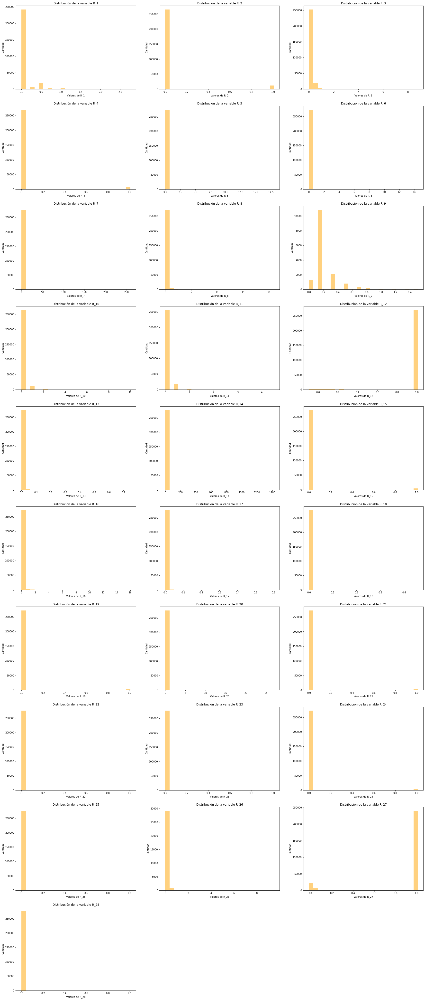

In [ ]:
plt.figure(figsize=(30,150))
for i, feature in enumerate(ds_r.columns):
  plt.subplot(20,3, i+1) 
  plt.hist(ds_r[feature], alpha = 0.5, bins=25, color='orange')
  plt.xlabel('Valores de '+feature)
  plt.ylabel('Cantidad')
  plt.title('Distribución de la variable '+feature)

**Análisis variables categóricas:**

Primero veremos un poco de información sobre las variables categóricas.

In [ ]:
ds[categ].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 276572 entries, 0 to 276571
Data columns (total 11 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   B_30    276470 non-null  float64
 1   B_38    276470 non-null  float64
 2   D_114   267707 non-null  float64
 3   D_116   267707 non-null  float64
 4   D_117   267707 non-null  float64
 5   D_120   267707 non-null  float64
 6   D_126   270757 non-null  float64
 7   D_63    276572 non-null  object 
 8   D_64    265652 non-null  object 
 9   D_66    31182 non-null   float64
 10  D_68    265698 non-null  float64
dtypes: float64(9), object(2)
memory usage: 23.2+ MB


Podemos ver que casi todas las variables categóricas son en realidad de tipo float, vamos a pasarlas a string para luego poder analizarlas.

In [ ]:
ds[categ] = ds[categ].astype('string') # El tipo 'string' conserva los NaN como tal, al contrario del tipo 'str' que los convierte 
ds[categ].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 276572 entries, 0 to 276571
Data columns (total 11 columns):
 #   Column  Non-Null Count   Dtype 
---  ------  --------------   ----- 
 0   B_30    276470 non-null  string
 1   B_38    276470 non-null  string
 2   D_114   267707 non-null  string
 3   D_116   267707 non-null  string
 4   D_117   267707 non-null  string
 5   D_120   267707 non-null  string
 6   D_126   270757 non-null  string
 7   D_63    276572 non-null  string
 8   D_64    265652 non-null  string
 9   D_66    31182 non-null   string
 10  D_68    265698 non-null  string
dtypes: string(11)
memory usage: 23.2 MB


Luego veremos la cantidad de valores nulos que tienen las variables categóricas.

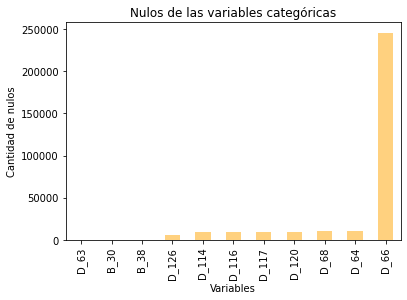

In [ ]:
ds[categ].isna().sum().sort_values().plot.bar(alpha=0.5 , title="Nulos de las variables categóricas" , xlabel="Variables" , ylabel="Cantidad de nulos", color='orange')

Vemos que la única variable que tiene en su mayoría valores nulos es la D_66.

In [ ]:
ds[categ].describe()

,B_30,B_38,D_114,D_116,D_117,D_120,D_126,D_63,D_64,D_66,D_68
count,276470,276470,267707,267707,267707,267707,270757,276572,265652,31182,265698
unique,3,7,2,2,7,2,3,6,4,2,7
top,0.0,2.0,1.0,0.0,-1.0,0.0,1.0,CO,O,1.0,6.0
freq,235547,98058,166083,267404,72954,236501,213119,205939,145446,30878,138801


A continuación, veremos gráficos de barras para los distintos valores que toman las variables categóricas y qué cantidad tienen éstas de cada valor.

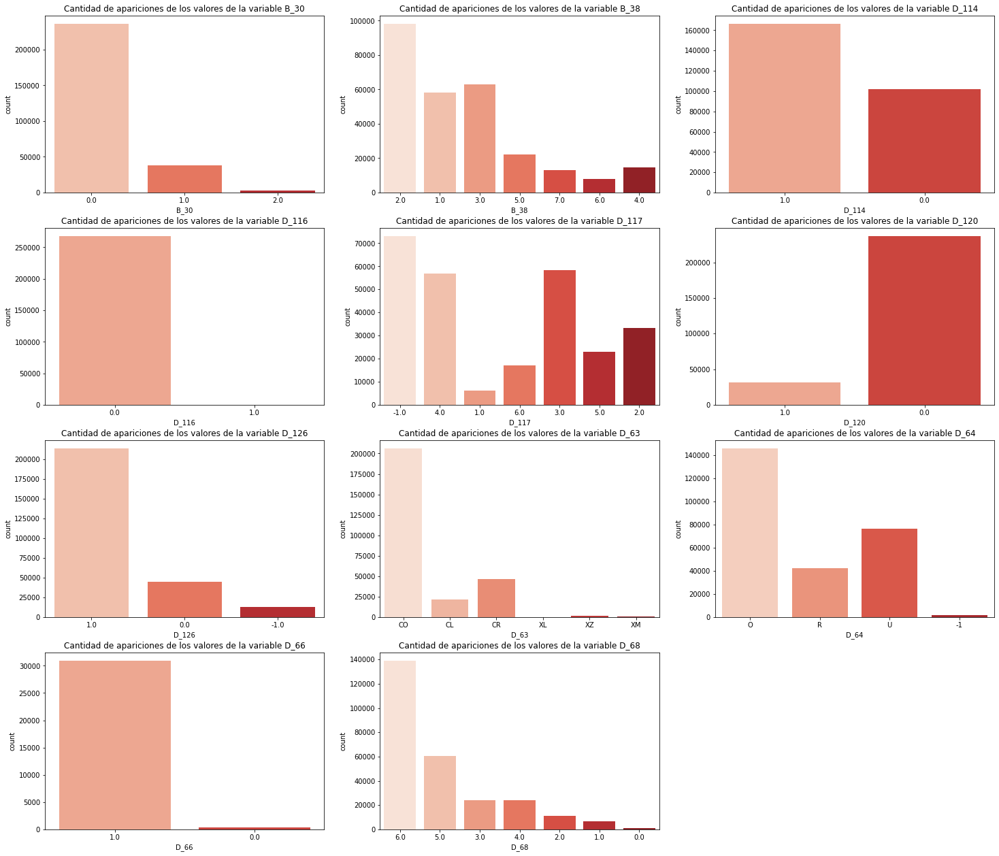

In [ ]:
plt.figure(figsize=(25,22))

for i, feature in enumerate(categ):
  plt.subplot(4,3,i+1)
  sns.countplot(x=ds[feature], palette='Reds')
  plt.title('Cantidad de apariciones de los valores de la variable '+feature)

Junto con los gráficos y la tabla podemos ver que:
* La variable B_30 tiene 3 valores, siendo el 0.0 el que aparece con más frecuencia.
* La variable B_38 tiene 7 valores, siendo el 2.0 el que aparece con más frecuencia.
* La variable D_114 tiene 2 valores, siendo el 1.0 el que aparece con más frecuencia.
* La variable D_116 tiene 2 valores, siendo el 0.0 el que aparece con más frecuencia.
* La variable D_117 tiene 7 valores, siendo el -1.0 el que aparece con más frecuencia.
* La variable D_120 tiene 2 valores, siendo el 0.0 el que aparece con más frecuencia.
* La variable D_126 tiene 3 valores, siendo el 1.0 el que aparece con más frecuencia.
* La variable D_63 tiene 6 valores, siendo el 'CO' el que aparece con más frecuencia.
* La variable D_64 tiene 4 valores, siendo el 'O' el que aparece con más frecuencia.
* La variable D_66 tiene 2 valores, siendo el 1.0 el que aparece con más frecuencia.
* La variable D_68 tiene 7 valores, siendo el 6.0 el que aparece con más frecuencia.

A continuación, vamos a ver cómo es el dataset de labels.

In [ ]:
labels.head(10)

,customer_ID,target
0,0000099d6bd597052cdcda90ffabf56573fe9d7c79be5f...,0
1,00000fd6641609c6ece5454664794f0340ad84dddce9a2...,0
2,00001b22f846c82c51f6e3958ccd81970162bae8b007e8...,0
3,000041bdba6ecadd89a52d11886e8eaaec9325906c9723...,0
4,00007889e4fcd2614b6cbe7f8f3d2e5c728eca32d9eb8a...,0
5,000084e5023181993c2e1b665ac88dbb1ce9ef621ec537...,0
6,000098081fde4fd64bc4d503a5d6f86a0aedc425c96f52...,0
7,0000d17a1447b25a01e42e1ac56b091bb7cbb06317be4c...,0
8,0000f99513770170a1aba690daeeb8a96da4a39f11fc27...,1
9,00013181a0c5fc8f1ea38cd2b90fe8ad2fa8cad9d9f13e...,1


Podemos ver que el dataset cuenta con dos columnas, una es `target` y la otra es `customer_ID`. La variable `target` es la que vamos a tener que predecir.

In [ ]:
labels.target.value_counts()

0    340085
1    118828
Name: target, dtype: int64

Vemos que `target` solo toma los valores 0 y 1. La misma vale 1 cuando el cliente, luego de 120 días después del último movimiento no realiza el pago adeudado, esto se considera un evento de inclumplimiento y vale 0 en caso contrario. 

In [ ]:
labels.isna().sum()

customer_ID    0
target         0
dtype: int64

Vemos que no hay valores nulos, por lo que procedemos a agregar a la variable `target` a nuestro dataset.

In [ ]:
ds_merge = ds.merge(labels, on="customer_ID", how="left")

In [ ]:
ds_merge.target.value_counts()

0    207631
1     68941
Name: target, dtype: int64

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


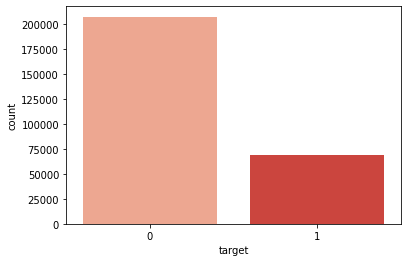

In [ ]:
sns.countplot(ds_merge['target'], palette='Reds')

Podemos decir mirando este gráfico que el dataset está desbalanceado, ya que hay muchos más valores positivos (0) que negativos (1). Esto puede traer problemas en el momento de entrenar los diferentes modelos ya que puede perjudicar a la clase que tiene menos apariciones, dando un bajo recall en ésta.

Luego de adicionar la variable `target` a nuestro dataset, vamos a visualizar un poco cómo se relaciona esta variable con las demás. 

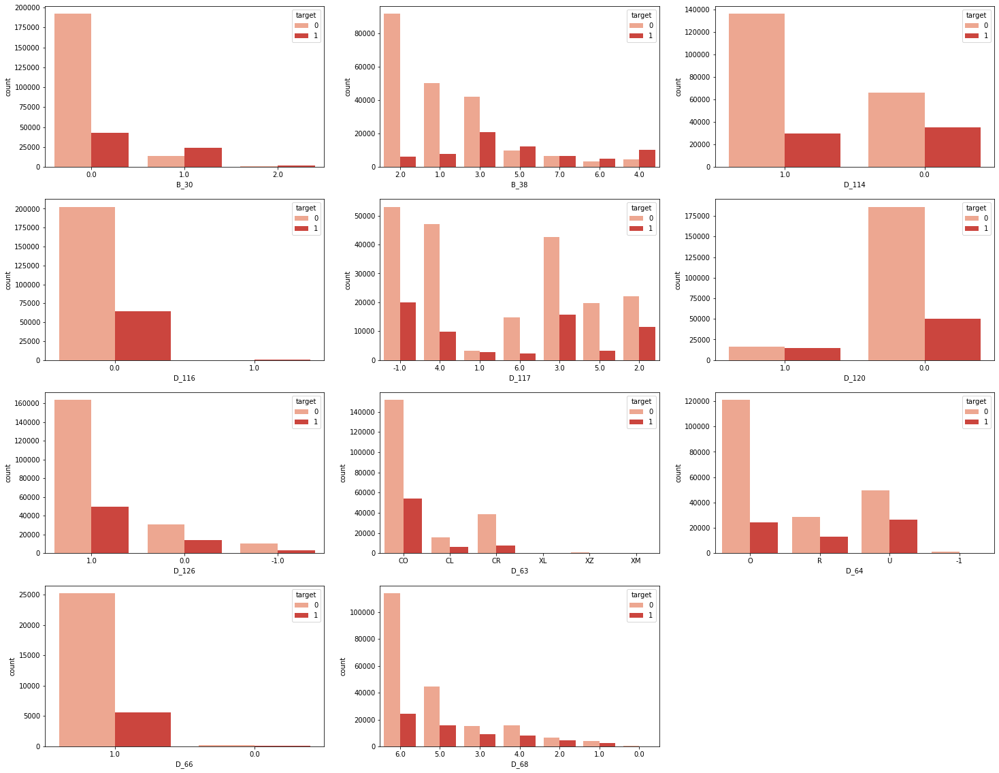

In [ ]:
plt.figure(figsize=(25,20))

for i,feature in enumerate(categ):
    plt.subplot(4,3,i+1)
    sns.countplot(x=ds_merge[feature],hue=ds_merge['target'], palette='Reds')

En los gráficos de arriba podemos ver la suma de las apariciones de cada valor de las variables categóricas, pero acá las sumas se dividen dependiendo si en fila tiene la variable `target` en 0 o en 1. Podemos ver que en casi todos los gráficos, las sumas más grandes son cuando la variable `target` está en cero (barra rojo claro), eso tiene sentido dado que, como vimos anteriormente, tenemos mayoría de filas con valor 0 que con 1 en `target`.

Ahora vamos a calcular correlaciones entre las variables de cada categoría con la variable target. Comenzaremos con las variables de la categoría D.

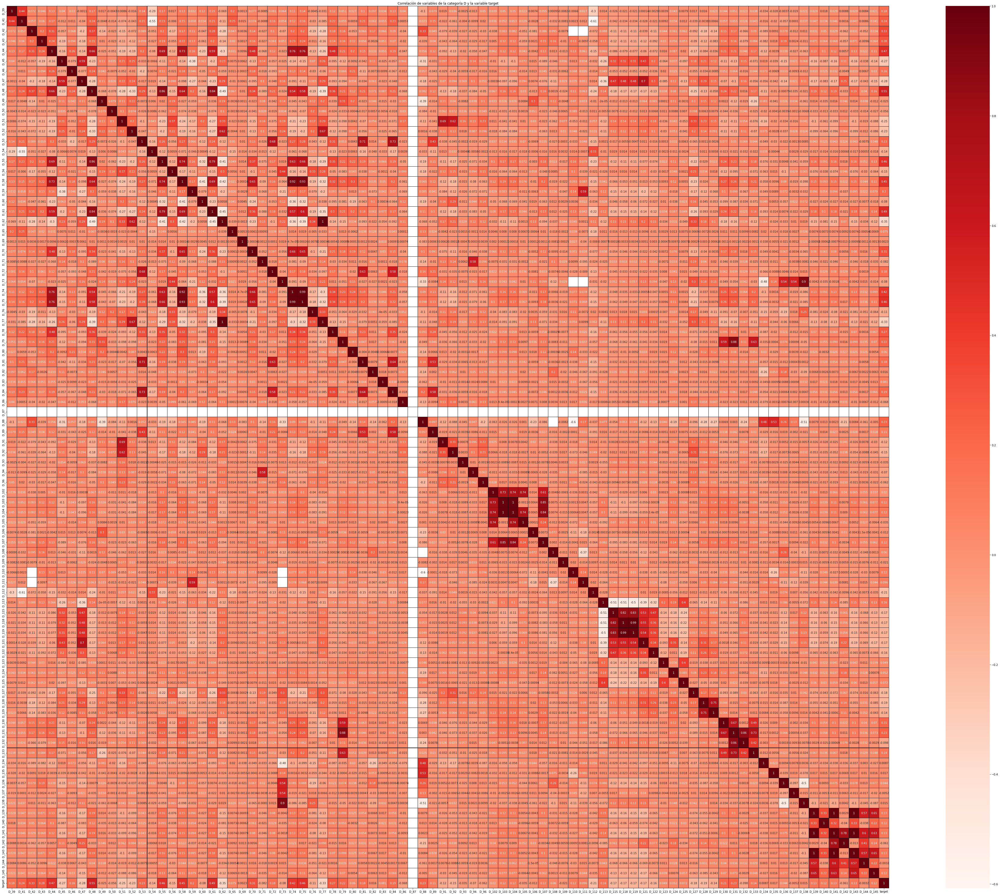

In [ ]:
tipo_D = list(ds_d.columns)
tipo_D.append('target')
pearson_corr = ds_merge[tipo_D].corr(method='pearson')
plt.figure(figsize=(75,60))
plt.title('Correlación de variables de la categoría D y la variable target')
sns.heatmap(pearson_corr, linewidth=.01, square = True, annot = True, cmap='Reds',linecolor ='black')
plt.show()

La correlación más alta con la variable target que se encuentra es la de la variable D_48, con un valor de 0.55.
Cerca de ese valor también tenemos la D_44 con 0.47 y la D_61 con 0.49.

Continuamos viendo la correlación con la categoría S.

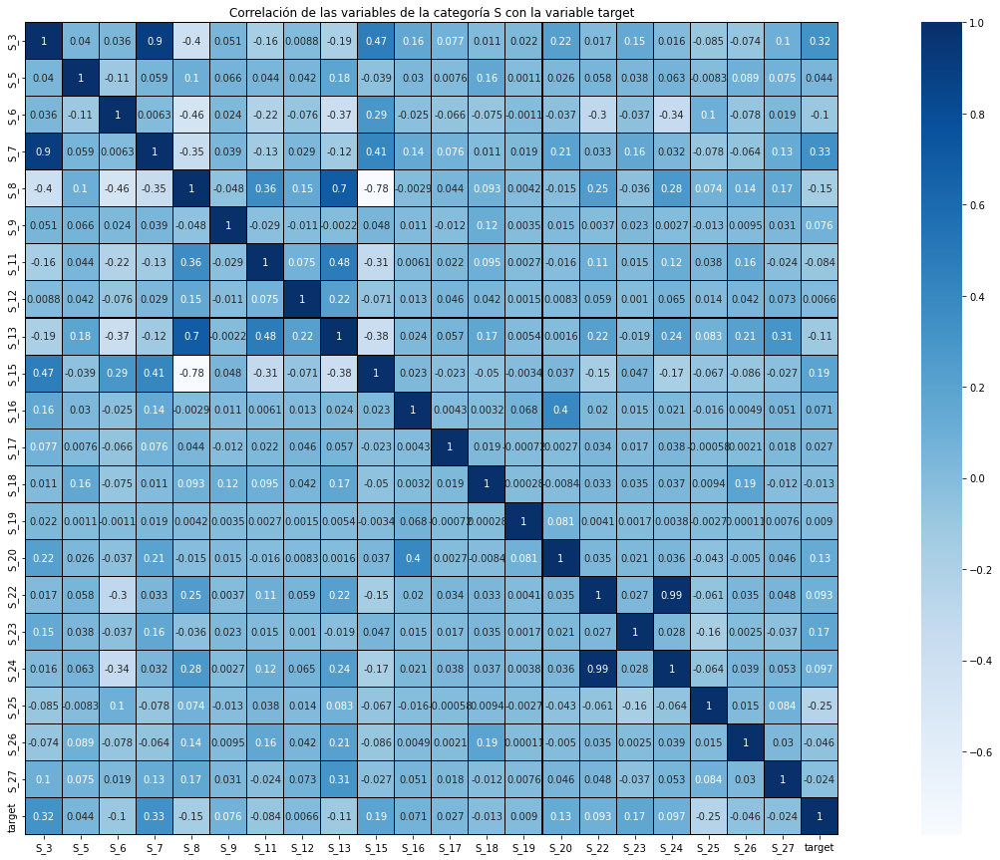

In [ ]:
tipo_S = list(ds_s.columns)
tipo_S.append('target')
pearson_corr = ds_merge[tipo_S].corr(method='pearson')
plt.figure(figsize=(30, 15))
plt.title('Correlación de las variables de la categoría S con la variable target')
sns.heatmap(pearson_corr, linewidth=.01, square = True, annot = True, cmap='Blues',linecolor ='black')
plt.show()

En este caso, la correlación más alta que se ve es la de la variable S_3 con un valor de 0.32. Dado a los bajos valores también se puede mencionar que la correlación negativa más alta es con la variable S_25 con un valor de -0.25.

Vamos a ver ahora la cantidad de apariciones de cada año y mes pero esta vez con respecto a la variable target.

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until


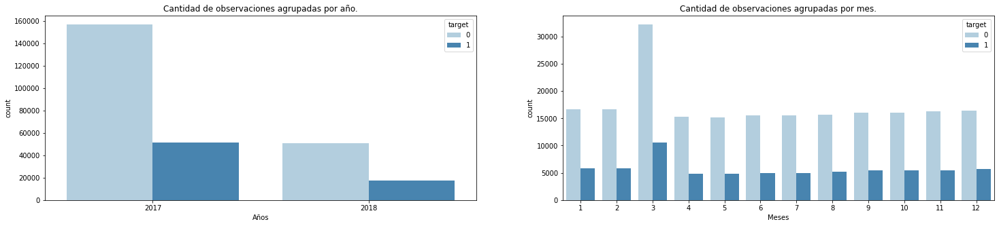

In [ ]:
plt.figure(figsize=(25,5))
ds_s_plot = ds_merge[tipo_S]
ds_s_plot['S_2'] = pd.to_datetime(ds_merge['S_2'])

plt.subplot(1, 2, 1)
sns.countplot(x=ds_s_plot['S_2'].dt.year, hue=ds_s_plot['target'], palette='Blues')
plt.xlabel('Años')
plt.title('Cantidad de observaciones agrupadas por año.')
plt.subplot(1, 2, 2)
sns.countplot(x=ds_s_plot['S_2'].dt.month, hue=ds_s_plot['target'], palette='Blues')
plt.xlabel('Meses')
plt.title('Cantidad de observaciones agrupadas por mes.')
plt.show()

Continuamos con las variables de la categoría B.

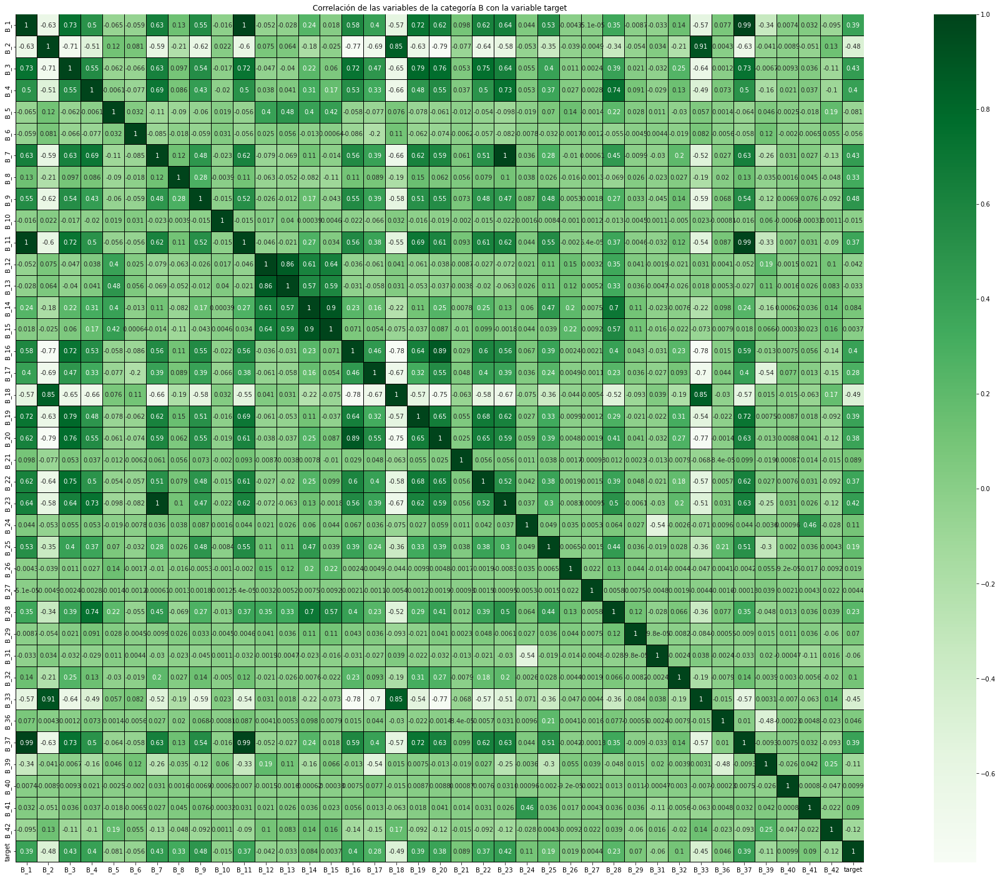

In [ ]:
tipo_B = list(ds_b.columns)
tipo_B.append('target')
pearson_corr = ds_merge[tipo_B].corr(method='pearson')
plt.figure(figsize=(40,25))
plt.title('Correlación de las variables de la categoría B con la variable target')
sns.heatmap(pearson_corr, linewidth=.01, square = True, annot = True, cmap='Greens',linecolor ='black')
plt.show()

En el caso de la categoría B, podemos observar que la variable target tiene correlación alta con la variable B_9 con un valor de 0.48, también con la B_3 y B_7, ambas con un valor de 0.43 y la correlación negativa más alta es con la variable B_33 con un valor de -0.45.

Continuamos con la categoría P.

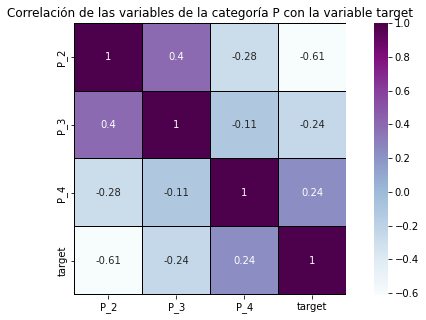

In [ ]:
tipo_P = list(ds_p.columns)
tipo_P.append('target')
pearson_corr = ds_merge[tipo_P].corr(method='pearson')
plt.figure(figsize=(10,5))
plt.title('Correlación de las variables de la categoría P con la variable target')
sns.heatmap(pearson_corr, linewidth=.01, square = True, annot = True, cmap='BuPu',linecolor ='black')
plt.show()

Para esta categoría vemos que la variable target tiene una correlación negativa bastante fuerte con la variable P_2, con un valor de -0.61 y en cuanto a la correlación positiva, la más alta es de 0.24 con la variable P_4.

Por último, mostramos las correlaciones con la categoría R.

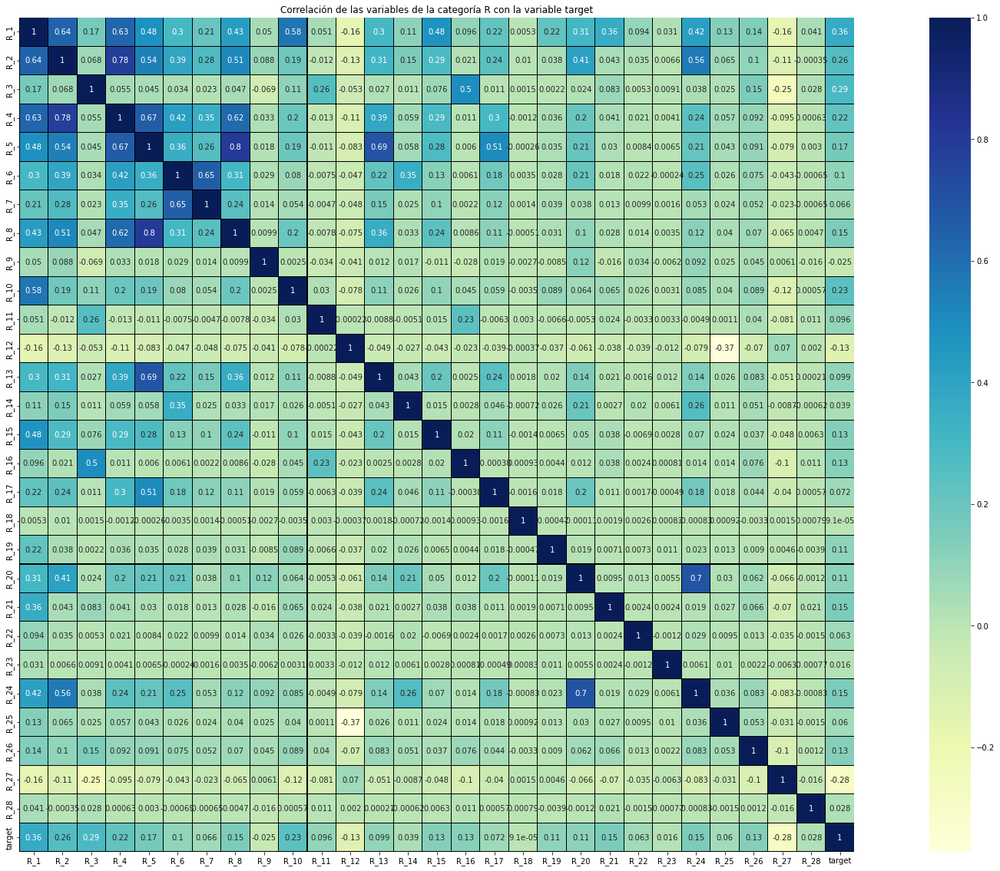

In [ ]:
tipo_R = list(ds_r.columns)
tipo_R.append('target')
pearson_corr = ds_merge[tipo_R].corr(method='pearson')
plt.figure(figsize=(35,20))
plt.title('Correlación de las variables de la categoría R con la variable target')
sns.heatmap(pearson_corr, linewidth=.01, square = True, annot = True, cmap='YlGnBu',linecolor ='black')
plt.show()

Podemos ver que la correlación más alta de la variable target es con la variable R_1 con un valor de 0.36. También se puede mencionar que tiene una correlación de 0.29 con la variable R_3. En cuanto a las correlaciones negativas, tiene con la R_27 un valor de -0.28.

#### b) Ingeniería de características:

##### b. a) y b) Revisar los datos faltantes o mal ingresados y verificar columnas a descartar e identificar nuevas columnas que podrían crearse

Como vimos en el punto anterior, hay varias columnas con un alto porcentaje de valores nulos, por lo tanto vamos a eliminar del dataset las columnas que tengan más del 40% de valores nulos. 

Se decidió usar ese límite para eliminarlos ya que, mirando los heatmap realizados de cada categoría con la variable target, podemos ver que ninguna de las variables que eliminamos tienen correlación alta con la variable a predecir, por lo que no serían variables importantes a la hora de entrenar y por lo tanto, opinamos que no se justifica hacer imputación de valores a estas variables ya que al tener alto índice de valores nulos, imputar crearía valores que no existen y podría empeorar los entrenamientos en vez de mejorarlos.

Las variables que tienen entre 100% y 80% de datos nulos son: D_87, D_88, D_108, D_111, D_110, D_39, D_73, B_42, D_134, D_138, D_135, D_136, D_137, R_9, B_29, D_106, D_132, D_49, R_26, D_76, D_66, D_42 y D_142. La principal razón para eliminar estas es directamente por la cantidad de valores nulos que tienen. Mientras que las variables que tienen entre 40% y 80% de valores nulos, se hizo un análisis un poco más profundo para estar seguros de eliminarlas. En los heeatmap podemos ver que:
* D_53 tiene correlación 0.23 con target.
* D_82 tiene correlación 0.016 con target.
* B_17 tiene correlación 0.28 con target.
* D_50 tiene correlación 0.056 con target.
* D_105 tiene correlación -0.035 con target.
* D_56 tiene correlación -0.15 con target.
* D_77 tiene correlación -0.33 con target.
* S_9 tiene correlación 0.076 con target.

Todas estas correlaciones son bajas, por lo que nos decidimos a eliminar estas columnas también.

In [ ]:
cols_eliminar = [col for col in ds_merge.columns if (ds_merge[col].isna().sum()*100/(len(ds_merge))) > 40]
print('Columnas a eliminar: ',cols_eliminar)

Columnas a eliminar:  ['D_42', 'D_49', 'D_50', 'D_53', 'D_56', 'S_9', 'B_17', 'D_66', 'D_73', 'D_76', 'D_77', 'R_9', 'D_82', 'B_29', 'D_87', 'D_88', 'D_105', 'D_106', 'R_26', 'D_108', 'D_110', 'D_111', 'B_39', 'B_42', 'D_132', 'D_134', 'D_135', 'D_136', 'D_137', 'D_138', 'D_142']


In [ ]:
ds_merge = ds_merge.drop(cols_eliminar, axis = 1)
categ.remove('D_66') # Elimino del vector de categóricas porque fue borrada del dataset

También vimos en los heatmaps que había algunas variables con correlaciones altas entre ellas, eso quiere decir que si tenemos dos variables con alta correlación, podemos prescindir de una de ellas ya que se comportan de la misma forma y no aportan información extra.

Procedemos a eliminar las columnas con correlación mayor o igual a +-0.8.

In [ ]:
cols_eliminar = ['D_139', 'D_141', 'D_74', 'D_75', 'S_24', 'S_3', 'B_1', 'B_11', 'B_33', 'B_14', 'R_8', 'D_131', 'D_55']
ds_merge = ds_merge.drop(cols_eliminar, axis=1)

También del punto anterior podemos ver que la variable S_2 es en realidad una fecha, por lo que vamos a renombrar la columna y vamos a cambiar el tipo de dato a fecha para que pueda ser trabajada como tal.

In [ ]:
ds_merge = ds_merge.rename(columns={'S_2':'fecha'})
ds_merge['fecha'] = pd.to_datetime(ds_merge['fecha'])
ds_merge

,customer_ID,fecha,P_2,D_39,B_2,R_1,D_41,B_3,D_43,D_44,...,D_129,B_41,D_130,D_133,R_28,D_140,D_143,D_144,D_145,target
0,00000fd6641609c6ece5454664794f0340ad84dddce9a2...,2017-05-07,0.922563,0.567403,1.007497,0.005594,0.003162,0.010466,NaN,0.004221,...,0.006578,0.007655,0.002805,0.001329,0.002501,0.002693,0.000996,0.003254,0.004469,0
1,00000fd6641609c6ece5454664794f0340ad84dddce9a2...,2017-08-19,0.910458,0.032285,1.000814,0.007448,0.005400,0.003697,NaN,0.004783,...,0.000799,0.005587,0.005803,0.002600,0.006524,0.004485,0.007862,0.009127,0.009390,0
2,00007889e4fcd2614b6cbe7f8f3d2e5c728eca32d9eb8a...,2018-02-27,0.879238,0.004148,0.813281,0.005484,0.004855,0.003961,0.037001,0.006139,...,1.007839,0.003136,1.008304,0.002636,0.002415,0.002953,0.004977,0.006325,0.002059,0
3,000084e5023181993c2e1b665ac88dbb1ce9ef621ec537...,2017-07-12,0.779851,0.007104,1.000452,0.009440,0.005054,0.005158,0.008233,NaN,...,1.007888,0.006242,0.009844,0.002825,0.007086,0.009525,0.001660,0.008940,0.001482,0
4,000098081fde4fd64bc4d503a5d6f86a0aedc425c96f52...,2017-04-22,0.414269,0.002516,0.123964,0.004374,0.001405,0.052130,0.053474,0.009452,...,0.001360,0.007997,0.008311,0.004756,0.004508,0.004050,0.001802,0.002364,0.003987,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
276567,fffe6355ed80789ab8c3ba18a4d10acc52964106ae7b98...,2017-12-25,0.888192,0.213786,0.819672,0.000422,0.003916,0.003870,NaN,0.005223,...,0.000343,0.004155,0.000719,0.008731,0.003071,0.004573,0.008773,0.002117,0.001264,0
276568,ffff41c8a52833b56430603969b9ca48d208e7c192c6a4...,2017-09-09,0.895553,0.002237,1.003776,0.006711,0.007834,0.002409,0.261274,0.000203,...,0.001501,0.008865,0.004919,0.001564,0.002609,0.007940,0.001129,0.008662,0.007075,0
276569,ffff9984b999fccb2b6127635ed0736dda94e544e67e02...,2017-03-16,0.793724,0.536278,1.008807,0.007620,0.252641,0.003013,0.075720,0.005637,...,1.000680,0.000377,0.005170,0.004267,0.000672,0.001692,0.009093,0.004573,0.001100,0
276570,ffff9984b999fccb2b6127635ed0736dda94e544e67e02...,2017-06-10,0.768016,0.357424,1.001626,0.003978,0.417198,0.154852,0.204526,0.002875,...,1.001342,0.001106,0.007591,0.002737,0.007642,0.002476,0.001238,0.009002,0.000204,0


Vemos que los cambios efectuados se realizaron, ya que ahora hay 147 columnas y el nombre de la columna S_2 ahora es "fecha".


A continuación, imputaremos los valores nulos de las variables categóricas y luego haremos la transformación de categórico a numérico para que puedan ser usadas por los modelos para predecir.

Comenzamos con la variable D_64:

In [ ]:
ds_merge['D_64'].value_counts()

O     145446
U      76189
R      42141
-1      1876
Name: D_64, dtype: Int64

Vimos anteriormente que esta variable tiene 4 valores: O, U, R y -1. Suponemos que el valor -1 se le asigna como un valor inválido, porque no se tiene la información o hubo un error. Por lo tanto, a todas las filas que sean nulas, les asignaremos el -1.

In [ ]:
ds_merge['D_64'] = ds_merge['D_64'].fillna("-1")
ds_merge['D_64'].isna().sum()

0

Vemos que los valores nulos han sido reemplazados exitosamente. 

Continuaremos con la recodificación de la columna. Utilizaremos la técnica de One Hot Encoding ya que esta variable categórica no es ordinal por lo que no sería correcto asignarles números a cada categoría porque de esa forma le estaríamos dando mas "peso" a algunas que a otras.

La codificación one-hot es un tipo de representación vectorial en la que todos los elementos de un vector son 0, excepto uno, que tiene 1 como valor, donde 1 representa una boolean especificando una categoría del elemento.

In [ ]:
ds_merge = pd.get_dummies(ds_merge, columns=['D_64'], drop_first = True)
ds_merge.head(2)

,customer_ID,fecha,P_2,D_39,B_2,R_1,D_41,B_3,D_43,D_44,...,D_133,R_28,D_140,D_143,D_144,D_145,target,D_64_O,D_64_R,D_64_U
0,00000fd6641609c6ece5454664794f0340ad84dddce9a2...,2017-05-07,0.922563,0.567403,1.007497,0.005594,0.003162,0.010466,NaN,0.004221,...,0.001329,0.002501,0.002693,0.000996,0.003254,0.004469,0,1,0,0
1,00000fd6641609c6ece5454664794f0340ad84dddce9a2...,2017-08-19,0.910458,0.032285,1.000814,0.007448,0.005400,0.003697,NaN,0.004783,...,0.002600,0.006524,0.004485,0.007862,0.009127,0.009390,0,1,0,0


Podemos ver que se crearon 3 columnas: D_64_O, D_64_R y D_64_U. Había 4 valores para esta columna pero al agregar el parámetro drop_first, hacemos que una de ellas no se compute ya que es redundante y se puede deducir a partir de los valores de las otras.

Continuamos con la columna D_63.

In [ ]:
ds_merge['D_63'].isna().sum()

0

Vemos que la variable no tiene valores nulos por lo que no es necesario computar nada.

Pasamos a decodificarla, utilizaremos la técnica One Hot Encoding por las mismas razones mencionadas para la variable D_64.

In [ ]:
ds_merge = pd.get_dummies(ds_merge, columns=['D_63'], drop_first = True)
ds_merge.head(2)

,customer_ID,fecha,P_2,D_39,B_2,R_1,D_41,B_3,D_43,D_44,...,D_145,target,D_64_O,D_64_R,D_64_U,D_63_CO,D_63_CR,D_63_XL,D_63_XM,D_63_XZ
0,00000fd6641609c6ece5454664794f0340ad84dddce9a2...,2017-05-07,0.922563,0.567403,1.007497,0.005594,0.003162,0.010466,NaN,0.004221,...,0.004469,0,1,0,0,1,0,0,0,0
1,00000fd6641609c6ece5454664794f0340ad84dddce9a2...,2017-08-19,0.910458,0.032285,1.000814,0.007448,0.005400,0.003697,NaN,0.004783,...,0.009390,0,1,0,0,1,0,0,0,0


Podemos ver que se crearon 5 columnas: D_63_CO, D_63_CR, D_63_XL, D_63_XM, D_63_XZ.

El resto de las variables categóricas tienen números como valores, suponemos que al asignarse números como categorías, estas tienen un orden. Por lo tanto, usaremos la técnica Ordinal Encoding, la misma consiste simplemente en remplazar cada valor de la variable con un número entero distinto.

Antes de realizar la codificación, computaremos los valores nulos de estas variables.

Comenzamos con la variable B_30.

In [ ]:
ds_merge['B_30'].isna().sum()*100/len(ds_merge)

0.03688008909072502

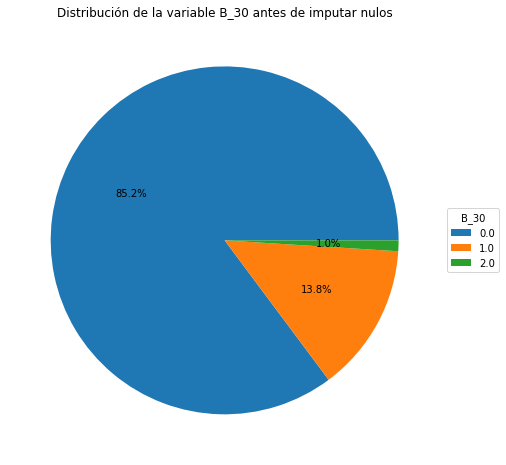

In [ ]:
plt.figure(figsize=(8,8))
plt.pie(ds_merge['B_30'].value_counts(), autopct='%1.1f%%')
plt.legend(labels = ds_merge['B_30'].value_counts().index, loc ='center left', bbox_to_anchor=(1, 0.5), title ='B_30',frameon = True)
plt.title('Distribución de la variable B_30 antes de imputar nulos')
plt.show()

Vemos que tiene un porcentaje bajo de valores nulos, por lo que decidimos imputar los valores nulos utilizando el método de sustitución por la media o mediana. Como esta es una variable categórica, utilizaremos la moda de la variable para reemplazar. La moda de una variable es el valor que tiene más apariciones. Si bien este método tiene algunas desventajas como que se atenúa la varianza o distorciona la distribución, la utilizamos en este caso ya que la cantidad de valores nulos es mínima comparado con el tamaño del dataset.

También podemos ver el gráfico de la distribución de la variable que utilizaremos para comparar luego de imputar.

In [ ]:
ds_merge['B_30'].fillna(ds_merge['B_30'].mode()[0], inplace=True)
ds_merge['B_30'].isna().sum()*100/len(ds_merge)

0.0

Vemos que ahora ya no hay más valores nulos en la columna B_30.

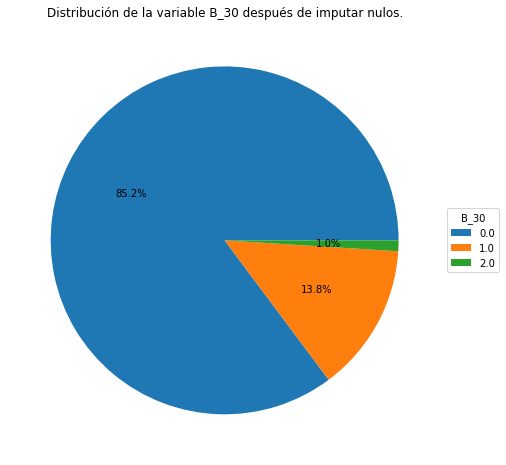

In [ ]:
plt.figure(figsize=(8,8))
plt.pie(ds_merge['B_30'].value_counts(), autopct='%1.1f%%')
plt.legend(labels = ds_merge['B_30'].value_counts().index, loc ='center left', bbox_to_anchor=(1, 0.5), title ='B_30',frameon = True)
plt.title('Distribución de la variable B_30 después de imputar nulos.')
plt.show()

Por último, vemos que la distribución no cambia respecto a antes de imputar los valores nulos.

Continuamos con la variable B_38.

In [ ]:
ds_merge['B_38'].isna().sum()*100/len(ds_merge)

0.03688008909072502

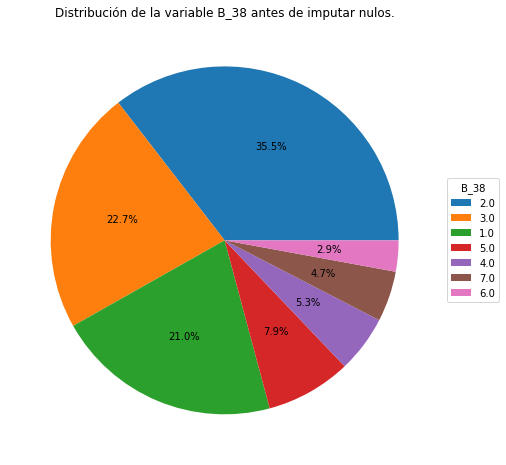

In [ ]:
plt.figure(figsize=(8,8))
plt.pie(ds_merge['B_38'].value_counts(), autopct='%1.1f%%')
plt.legend(labels = ds_merge['B_38'].value_counts().index, loc ='center left', bbox_to_anchor=(1, 0.5), title ='B_38',frameon = True)
plt.title('Distribución de la variable B_38 antes de imputar nulos.')
plt.show()

Vemos que también posee un porcentaje muy bajo de valores nulos, por lo que imputaremos esos valores con la misma técnica usada con la variable B_30, la de sustitución por moda.

In [ ]:
ds_merge['B_38'].fillna(ds_merge['B_38'].mode()[0], inplace=True)
ds_merge['B_38'].isna().sum()*100/len(ds_merge)

0.0

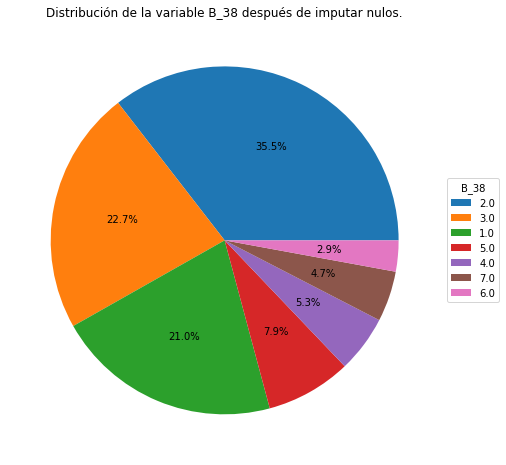

In [ ]:
plt.figure(figsize=(8,8))
plt.pie(ds_merge['B_38'].value_counts(), autopct='%1.1f%%')
plt.legend(labels = ds_merge['B_38'].value_counts().index, loc ='center left', bbox_to_anchor=(1, 0.5), title ='B_38',frameon = True)
plt.title('Distribución de la variable B_38 después de imputar nulos.')
plt.show()

Podemos ver que ya no hay más valores nulos y que la distribución de la variable no cambia significativamente al imputar los valores nulos.

Continuamos con la variable D_114.

In [ ]:
ds_merge['D_114'].isna().sum()*100/len(ds_merge)

3.2053136253850716

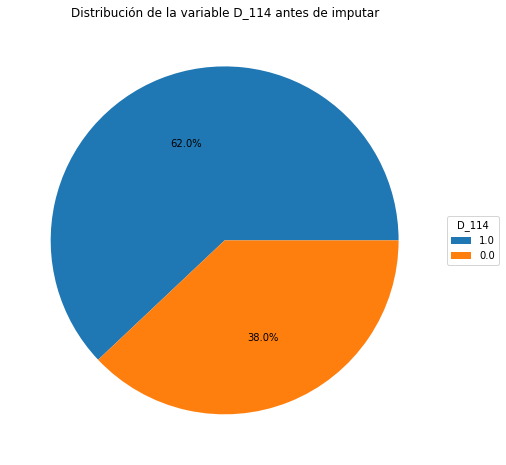

In [ ]:
plt.figure(figsize=(8,8))
plt.pie(ds_merge['D_114'].value_counts(), autopct='%1.1f%%')
plt.legend(labels = ds_merge['D_114'].value_counts().index, loc ='center left', bbox_to_anchor=(1, 0.5), title ='D_114',frameon = True)
plt.title('Distribución de la variable D_114 antes de imputar')
plt.show()

En este caso vemos que esta variable tiene un porcentaje de valores nulos más alto de los que veníamos viendo con las dos variables anteriores aunque este porcentaje sigue siendo bajo, por lo que decidimos utilizar la misma técnica de sustitución por moda.

In [ ]:
ds_merge['D_114'].fillna(ds_merge['D_114'].mode()[0], inplace=True)
ds_merge['D_114'].isna().sum()*100/len(ds_merge)

0.0

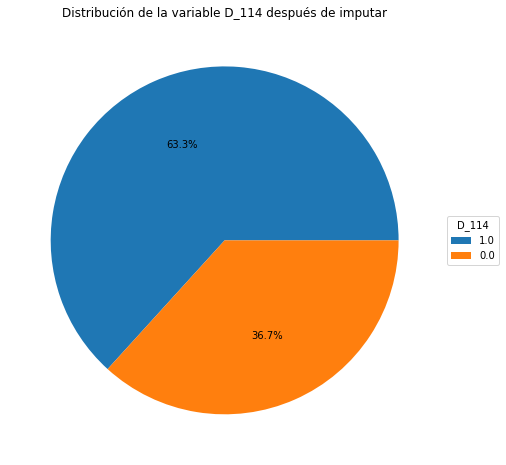

In [ ]:
plt.figure(figsize=(8,8))
plt.pie(ds_merge['D_114'].value_counts(), autopct='%1.1f%%')
plt.legend(labels = ds_merge['D_114'].value_counts().index, loc ='center left', bbox_to_anchor=(1, 0.5), title ='D_114',frameon = True)
plt.title('Distribución de la variable D_114 después de imputar')
plt.show()

Podemos ver que en esta caso la distribución cambia un poco con respecto a antes de imputar, pero ese cambio no es significativo y los valores cambiaron muy poco, se paso de 62% del valor 1 al 63.3 y el valor 0 paso de 38% a 36.7%.

Continuaremos con la variable D_116.

In [ ]:
ds_merge['D_116'].isna().sum()*100/len(ds_merge)

3.2053136253850716

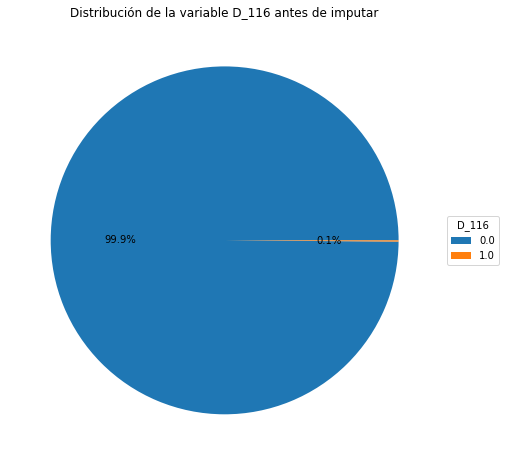

In [ ]:
plt.figure(figsize=(8,8))
plt.pie(ds_merge['D_116'].value_counts(), autopct='%1.1f%%')
plt.legend(labels = ds_merge['D_116'].value_counts().index, loc ='center left', bbox_to_anchor=(1, 0.5), title ='D_116',frameon = True)
plt.title('Distribución de la variable D_116 antes de imputar')
plt.show()

Esta variable, al igual que la D_114, también tiene un porcentaje más alto que las primera dos aunque sigue sin ser muy significativo por lo que continuaremos usando la técnica de sustitución por moda.

In [ ]:
ds_merge['D_116'].fillna(ds_merge['D_116'].mode()[0], inplace=True)
ds_merge['D_116'].isna().sum()*100/len(ds_merge)

0.0

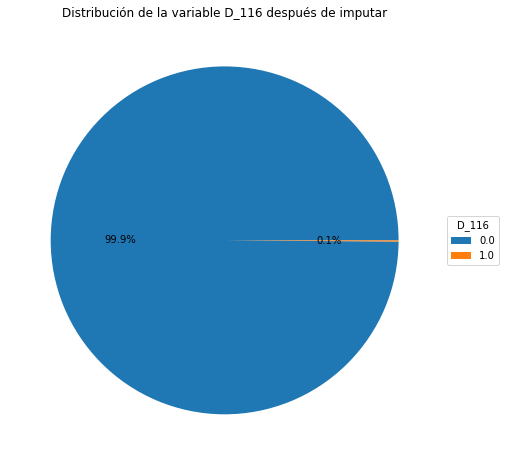

In [ ]:
plt.figure(figsize=(8,8))
plt.pie(ds_merge['D_116'].value_counts(), autopct='%1.1f%%')
plt.legend(labels = ds_merge['D_116'].value_counts().index, loc ='center left', bbox_to_anchor=(1, 0.5), title ='D_116',frameon = True)
plt.title('Distribución de la variable D_116 después de imputar')
plt.show()

Acá también vemos que la distribución no cambia ya que hay una clara mayoría del valor 0 en esta variable.

Continuamos con la variable D_117.

In [ ]:
ds_merge['D_117'].isna().sum()*100/len(ds_merge)

3.2053136253850716

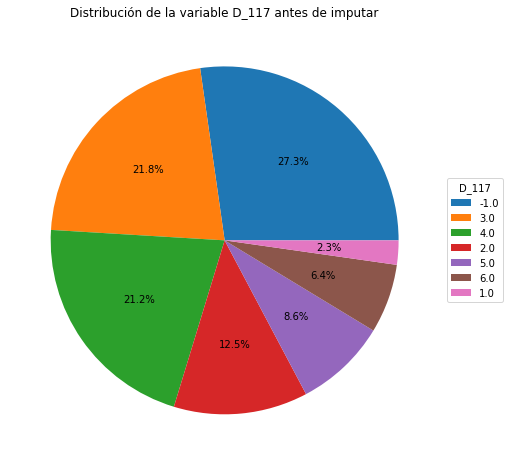

In [ ]:
plt.figure(figsize=(8,8))
plt.pie(ds_merge['D_117'].value_counts(), autopct='%1.1f%%')
plt.legend(labels = ds_merge['D_117'].value_counts().index, loc ='center left', bbox_to_anchor=(1, 0.5), title ='D_117',frameon = True)
plt.title('Distribución de la variable D_117 antes de imputar')
plt.show()

Vemos que en esta variable es la que más nulos tiene hasta ahora, pero sigue siendo en valores bajos por lo que seguiremos utilizando la técnica de sustitución por moda.

In [ ]:
ds_merge['D_117'].fillna(ds_merge['D_117'].mode()[0], inplace=True)
ds_merge['D_117'].isna().sum()*100/len(ds_merge)

0.0

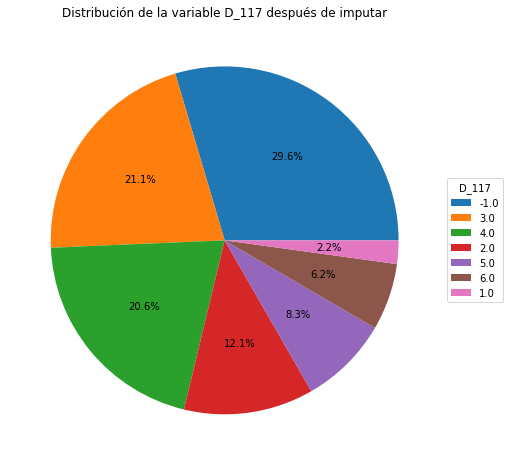

In [ ]:
plt.figure(figsize=(8,8))
plt.pie(ds_merge['D_117'].value_counts(), autopct='%1.1f%%')
plt.legend(labels = ds_merge['D_117'].value_counts().index, loc ='center left', bbox_to_anchor=(1, 0.5), title ='D_117',frameon = True)
plt.title('Distribución de la variable D_117 después de imputar')
plt.show()

Vemos que la cantidad de nulos es 0 y además vemos que la distribución no cambia significativamente, el valor -1 pasó de 27.3% a 29.6%, ese es el cambio más grande y sucede porque los nulos tomaron ese valor es la moda.

Continuamos con la variable D_120.

In [ ]:
ds_merge['D_120'].isna().sum()*100/len(ds_merge)

3.2053136253850716

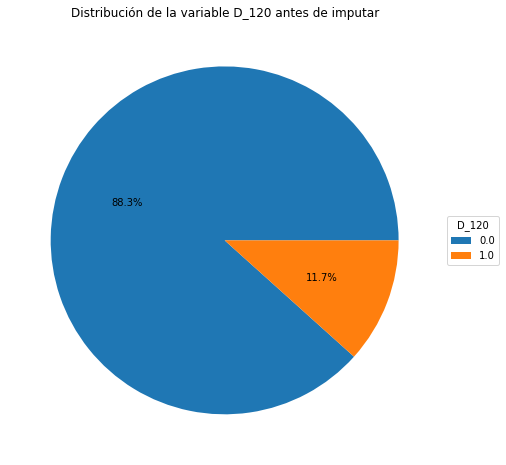

In [ ]:
plt.figure(figsize=(8,8))
plt.pie(ds_merge['D_120'].value_counts(), autopct='%1.1f%%')
plt.legend(labels = ds_merge['D_120'].value_counts().index, loc ='center left', bbox_to_anchor=(1, 0.5), title ='D_120',frameon = True)
plt.title('Distribución de la variable D_120 antes de imputar')
plt.show()

El porcentaje de nulos en esta variable sigue siendo bajo por lo que seguiremos utilizando la técnica de sustitución por moda.

In [ ]:
ds_merge['D_120'].fillna(ds_merge['D_120'].mode()[0], inplace=True)
ds_merge['D_120'].isna().sum()*100/len(ds_merge)

0.0

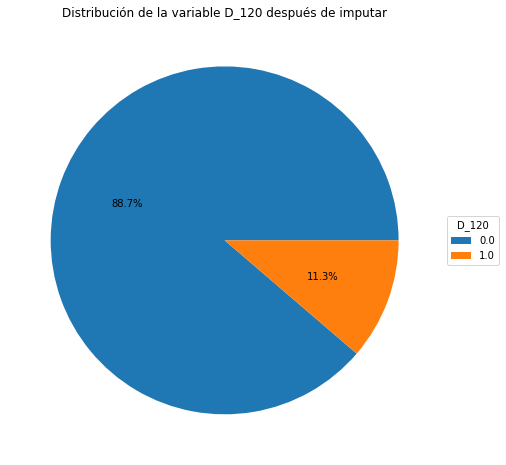

In [ ]:
plt.figure(figsize=(8,8))
plt.pie(ds_merge['D_120'].value_counts(), autopct='%1.1f%%')
plt.legend(labels = ds_merge['D_120'].value_counts().index, loc ='center left', bbox_to_anchor=(1, 0.5), title ='D_120',frameon = True)
plt.title('Distribución de la variable D_120 después de imputar')
plt.show()

Vemos que la cantidad de nulos es ahora cero y además la distribución no cambia significativamente.

Continuamos con la variable D_126.

In [ ]:
ds_merge['D_126'].isna().sum()*100/len(ds_merge)

2.1025266476722155

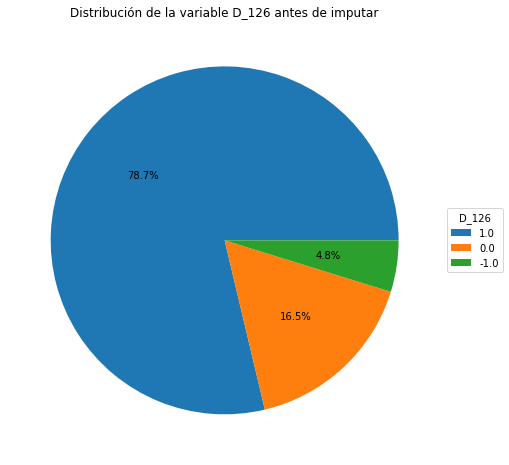

In [ ]:
plt.figure(figsize=(8,8))
plt.pie(ds_merge['D_126'].value_counts(), autopct='%1.1f%%')
plt.legend(labels = ds_merge['D_126'].value_counts().index, loc ='center left', bbox_to_anchor=(1, 0.5), title ='D_126',frameon = True)
plt.title('Distribución de la variable D_126 antes de imputar')
plt.show()

En el caso de la variable D_126 sigue siendo baja la cantidad de nulos, por lo que seguimos aplicando la misma técnica de imputación.

In [ ]:
ds_merge['D_126'].fillna(ds_merge['D_126'].mode()[0], inplace=True)
ds_merge['D_126'].isna().sum()*100/len(ds_merge)

0.0

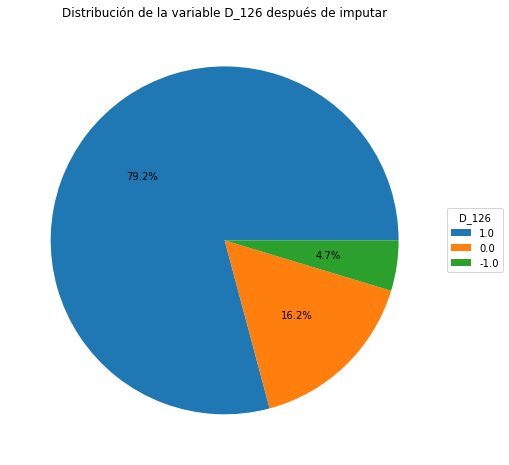

In [ ]:
plt.figure(figsize=(8,8))
plt.pie(ds_merge['D_126'].value_counts(), autopct='%1.1f%%')
plt.legend(labels = ds_merge['D_126'].value_counts().index, loc ='center left', bbox_to_anchor=(1, 0.5), title ='D_126',frameon = True)
plt.title('Distribución de la variable D_126 después de imputar')
plt.show()

Acá también vemos que la distribución no cambia significativamente.

Por último, imputamos la variable D_68.

In [ ]:
ds_merge['D_68'].isna().sum()*100/len(ds_merge)

3.9317067526719987

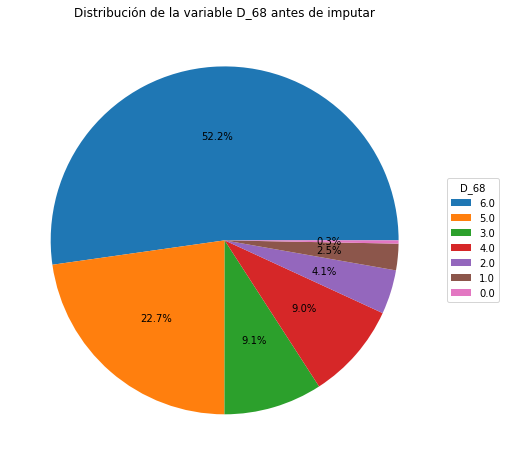

In [ ]:
plt.figure(figsize=(8,8))
plt.pie(ds_merge['D_68'].value_counts(), autopct='%1.1f%%')
plt.legend(labels = ds_merge['D_68'].value_counts().index, loc ='center left', bbox_to_anchor=(1, 0.5), title ='D_68',frameon = True)
plt.title('Distribución de la variable D_68 antes de imputar')
plt.show()

Vemos que la cantidad de nulos tampoco es significativa en esta variable, por lo que continuamos usando la misma técnica.

In [ ]:
ds_merge['D_68'].fillna(ds_merge['D_68'].mode()[0], inplace=True)
ds_merge['D_68'].isna().sum()*100/len(ds_merge)

0.0

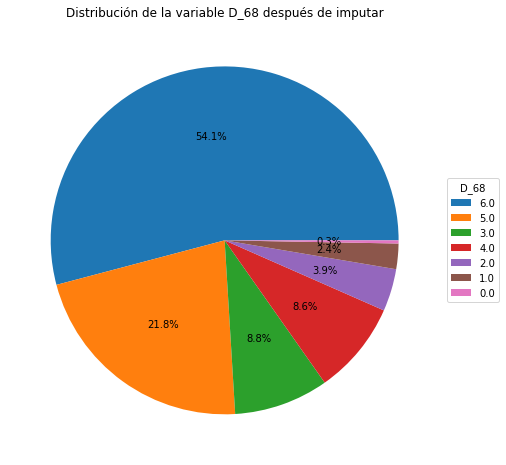

In [ ]:
plt.figure(figsize=(8,8))
plt.pie(ds_merge['D_68'].value_counts(), autopct='%1.1f%%')
plt.legend(labels = ds_merge['D_68'].value_counts().index, loc ='center left', bbox_to_anchor=(1, 0.5), title ='D_68',frameon = True)
plt.title('Distribución de la variable D_68 después de imputar')
plt.show()

Esta distribución es la que más cambia respecto a antes de la imputación (el valor 6 pasa de 47.7% a 50.2%) pero creemos que este cambio sigue sin ser significativo como para buscar una mejor forma de imputación.

Como ya terminamos de imputar los valores nulos de cada variable categórica, pasaremos a codificarlas (transformarlas a valores numéricos), como ya mencionamos, utilizaremos el método Ordinal Encoding ya que los valores de estas columnas tienen un orden. 

Agregaremos a las columnas a transformar la columna fecha, fecha_min y fecha_max ya que también debe ser numérica para poder ser usada para entrenar. Esta también puede codificarse con el método de Ordinal Encoding ya que las fechas tienen un orden.

In [ ]:
categ_copy = categ.copy()
# Eliminamos las dos categorías que codificamos con el One Hot Encoding anteriormente
categ_copy.remove('D_63')
categ_copy.remove('D_64')
categ_copy.append('fecha')

encoder = OrdinalEncoder()
ds_merge[categ_copy] = encoder.fit_transform(ds_merge[categ_copy].astype(str))
ds_merge[categ_copy].info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 276572 entries, 0 to 276571
Data columns (total 9 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   B_30    276572 non-null  float64
 1   B_38    276572 non-null  float64
 2   D_114   276572 non-null  float64
 3   D_116   276572 non-null  float64
 4   D_117   276572 non-null  float64
 5   D_120   276572 non-null  float64
 6   D_126   276572 non-null  float64
 7   D_68    276572 non-null  float64
 8   fecha   276572 non-null  float64
dtypes: float64(9)
memory usage: 29.2 MB


In [ ]:
ds_merge[categ_copy].isna().sum()

B_30     0
B_38     0
D_114    0
D_116    0
D_117    0
D_120    0
D_126    0
D_68     0
fecha    0
dtype: int64

Podemos ver que ahora las columnas categóricas tienen valores numéricos y además vemos que no poseen valores nulos.

Ahora debemos continuar con la imputación de valores nulos para el resto de las variables, primero nos fijaremos cuáles son las que aún poseen valores nulos.

In [ ]:
nulos = ds_merge.isna().sum().mul(100).div(len(ds_merge)).sort_values(ascending=False)
nulos[:50]

D_43     29.887335
S_27     25.326859
D_46     21.947269
S_7      18.447276
D_62     13.678174
D_48     13.032050
D_61     10.784172
P_3       5.445598
D_78      4.903967
D_44      4.903967
D_83      3.531811
D_69      3.531811
D_121     3.205314
D_122     3.205314
D_124     3.205314
D_125     3.205314
D_118     3.205314
D_115     3.205314
D_113     3.205314
D_119     3.205314
D_123     3.205314
D_91      2.829281
R_27      2.334654
D_59      1.892455
D_145     1.813994
D_129     1.813994
D_103     1.813994
D_107     1.813994
D_143     1.813994
D_104     1.813994
D_128     1.813994
D_130     1.813994
D_70      1.658881
D_79      1.324068
B_13      0.861620
P_2       0.807746
D_133     0.738325
D_144     0.699637
D_102     0.696744
D_140     0.696744
D_84      0.506920
D_89      0.506920
D_52      0.506920
D_81      0.445454
D_72      0.403150
B_8       0.389049
D_80      0.377479
S_22      0.334090
S_25      0.235020
B_15      0.120764
dtype: float64

Con la imputación de variables categóricas pudimos darnos cuenta que el método de sustitución por moda nos sirve para porcentajes bajos de nulos. Vimos con la última variable categórica que imputamos (D_68) que con un porcentaje casi del 5% de nulos ya había un cambio un poco más importante en la distribución de la variable. Por lo que hemos decidido que para las variables con porcentajes de nulos más grandes que 5%, utilizaremos el método de imputación por regresión, mientras que para las que tienen menos seguiremos usando el método de sustitución, en este caso será por media ya que son variables numéricas.

In [ ]:
var_reg = [col for col in ds_merge.columns if (ds_merge[col].isna().sum()*100/(len(ds_merge))) > 5]
var_sust = [col for col in ds_merge.columns if (ds_merge[col].isna().sum()*100/(len(ds_merge))) < 5 and (ds_merge[col].isna().sum()*100/(len(ds_merge))) > 0]

print('Las variables que se imputaran usando regresión son: ', var_reg)
print('Las variables que se imputaran usando sustitución por media son: ', var_sust)

Las variables que se imputaran usando regresión son:  ['D_43', 'D_46', 'D_48', 'P_3', 'S_7', 'D_61', 'D_62', 'S_27']
Las variables que se imputaran usando sustitución por media son:  ['P_2', 'B_2', 'D_41', 'B_3', 'D_44', 'D_45', 'B_6', 'B_8', 'D_52', 'D_54', 'B_13', 'D_59', 'B_15', 'B_16', 'B_19', 'B_20', 'D_69', 'B_22', 'D_70', 'D_72', 'B_25', 'B_26', 'D_78', 'D_79', 'D_80', 'B_27', 'D_81', 'R_12', 'D_83', 'D_84', 'R_20', 'D_89', 'D_91', 'S_22', 'S_23', 'S_25', 'S_26', 'D_102', 'D_103', 'D_104', 'D_107', 'B_37', 'R_27', 'D_109', 'D_112', 'B_40', 'D_113', 'D_115', 'D_118', 'D_119', 'D_121', 'D_122', 'D_123', 'D_124', 'D_125', 'D_128', 'D_129', 'B_41', 'D_130', 'D_133', 'D_140', 'D_143', 'D_144', 'D_145']


Primero haremos las imputaciones por sustitución por media.

In [ ]:
for col in var_sust:
  ds_merge[col].fillna(ds_merge[col].mean(), inplace=True)
  
ds_merge.isna().sum().mul(100).div(len(ds_merge)).sort_values(ascending=False)[:30]

D_43           29.887335
S_27           25.326859
D_46           21.947269
S_7            18.447276
D_62           13.678174
D_48           13.032050
D_61           10.784172
P_3             5.445598
customer_ID     0.000000
D_96            0.000000
S_22            0.000000
S_23            0.000000
S_25            0.000000
S_26            0.000000
D_104           0.000000
D_102           0.000000
D_103           0.000000
D_107           0.000000
B_36            0.000000
B_37            0.000000
R_27            0.000000
B_38            0.000000
R_25            0.000000
D_94            0.000000
R_24            0.000000
D_112           0.000000
S_18            0.000000
D_86            0.000000
R_17            0.000000
R_18            0.000000
dtype: float64

Podemos ver que las únicas columnas con valores nulos son ahora las que tienen más de 5% de valores nulos.

Ahora continuaremos con estas variables que quedan y, como fue mencionado, elegimos el método de imputación por regresión. 

Elegimos ese método ya que el método de sustitución por media tiene varias contras que en este caso pueden incidir más ya que la cantidad de nulos es más grande. También estaba la posibilidad de usar el método de imputación Hot Deck usando k vecinos más cercanos pero ese método utiliza todo el dataset para entrenar y eso requiere mucha memoria y es por eso que suele funcionar mejor en datasets pequeños sin muchas columnas. Ese no es el caso de nuestro dataset, es muy grande, es por eso que decidimos usar la imputación por regresión. 

Declararemos una función que luego utilizaremos para imputar los datos de cada una de las variables mencionadas previamente. 

In [ ]:
def imputar_datos(valor, fila, col):
  if (pd.isna(valor)): 
    columnas_prediccion = fila.copy().drop(labels=['fecha', 'customer_ID']).drop(labels=var_reg)
    ds_merge.loc[fila.name, col] = reg.predict(columnas_prediccion.values.reshape(1,-1)) #Para predecir, es necesario que la información que le damos al modelo sea del mismo formato que la utilizada para entrenarlo.

Lo que hacemos es entrenar el modelo de regresión lineal para cada caso. Buscamos predecir los datos faltantes teniendo en cuenta los valores de las demás columnas, para esto utilizaremos aquellas que no pertenezcan al vector var_reg y cuyos datos sean numéricos.

In [ ]:
ds_train = ds_merge.copy().dropna();
seed = 7
for col in var_reg:
  ds_y = ds_train[col].copy().values
  ds_x = ds_train.drop(['fecha', 'customer_ID'], axis=1).drop(var_reg, axis=1) # Necesito valores numéricos no nulos para entrenar 
  x_train, x_test, y_train, y_test = train_test_split(ds_x.values, ds_y, test_size=0.2, random_state=seed)
  reg = LinearRegression().fit(x_train, y_train)
  prediccion_regresion = reg.predict(x_test)
  rmse = mean_squared_error(
    y_true  = y_test,
    y_pred  = prediccion_regresion,
    squared = False
  );
  print('Error cuadrático medio para modelo de regresión utilizado en variable ', col,': ', rmse);
  ds_merge.apply(lambda row: imputar_datos(row[col], row, col), axis=1);

Error cuadrático medio para modelo de regresión utilizado en variable  D_43 :  0.14534072231218137
Error cuadrático medio para modelo de regresión utilizado en variable  D_46 :  0.17067869296518615
Error cuadrático medio para modelo de regresión utilizado en variable  D_48 :  0.16299870135731412
Error cuadrático medio para modelo de regresión utilizado en variable  P_3 :  0.14579355976139785
Error cuadrático medio para modelo de regresión utilizado en variable  S_7 :  0.16533575971046094
Error cuadrático medio para modelo de regresión utilizado en variable  D_61 :  0.1799361036819901
Error cuadrático medio para modelo de regresión utilizado en variable  D_62 :  0.14527807399438103
Error cuadrático medio para modelo de regresión utilizado en variable  S_27 :  0.22734645035316178


Para cada caso podemos ver que el error cuadrático medio se mantiene en números bajos por lo que los modelos entrenados tienen un buen desempeño al momento de predecir.

In [ ]:
ds_merge[var_reg].isna().sum()

D_43    0
D_46    0
D_48    0
P_3     0
S_7     0
D_61    0
D_62    0
S_27    0
dtype: int64

Ya que este proceso de imputación demora algunos minutos, comprimimos el nuevo dataset generado en un pickle, para luego poder descargarlo mas rápido.

In [ ]:
## Esto se realiza cada vez que se quiera actualizar el dataset.
## En la seccion de 'Librerias y datasets' ya se encuentra uno descargado.
ds_merge.to_pickle("ds_merge_pickle.pkl")

Una vez realizado el modelo de regresión y después de haber imputado los datos, vemos que finalmente ya no se encuentran valores nulos en las columnas del vector var_reg.

##### b. c) Identificación de outliers.

Para este análisis lo que vamos a hacer es para cada tipo de variable de nuestro dataframe, vamos a graficar un boxplot para poder visualizar outliers dentro de cada categoría. Tambien vamos a calcular el zscore para cada columna de la categoria y representar en un grafico la cantidad de variables que superan la regla de oro `abs(zscore) > 3`.  
Luego, si en el boxplot se detectan valores atípicos, vamos a definir un umbral para detectar outliers. Si existen valores que superen dicho umbral y sean una cantidad que no afecten a la data, vamos a considerarlos outliers.

In [ ]:
# cols: lista de columnas de la categroia, por ejemplo: ['D_126', 'D_23', ...]
# category: sufijo de la categoria, por ejemplo: 'D'
def calc_outliers_zscore(cols, category):
  zscore = st.zscore(ds_merge[cols]) # calculo zscore para cada columna
  plt.figure(figsize=(50,8))
  plt.xlabel(f'Columnas de {category}') 
  plt.ylabel('Cantidad de valores que superan el umbral')
  max = 0
  max_col = ''
  for col in zscore:
    # Me fijo en cada columna, cuantos valores supera el umbral
    count = len(zscore[abs(zscore[col]) > 3].values)
    if (count > 0):
      plt.bar(x=col, height=count)
    if (count > max):
      max = count
      max_col = col
  print(f"La columna con mas valores que superan el umbral fue {max_col}")
  plt.show()

###### Análisis de outliers para la columna tipo D:

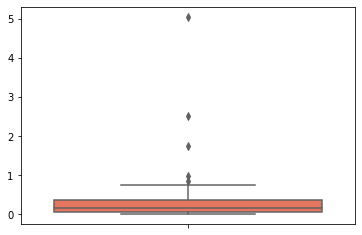

In [ ]:
col_D = ds_merge.filter(regex=('D_*')).columns.values[1:]
media_D = np.mean(ds_merge[col_D])
sns.boxplot(y=media_D, palette='Reds')

La columna con mas valores que superan el umbral fue D_92


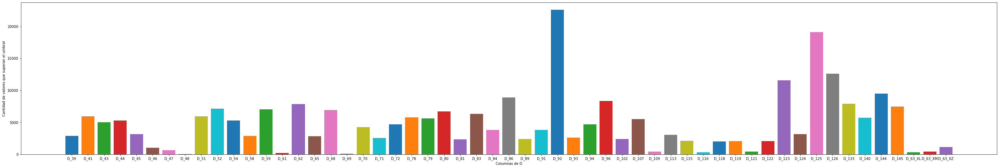

In [ ]:
calc_outliers_zscore(col_D, 'D')

Podemos observar que se encuentran algunos outliers posibles. Las variables de esta columna toman valores entre 0 y 0.5 pero podemos observar que algunos de estos valores superan el 1. Veamos cuantos valores superan esta cantidad.

In [ ]:
umbral_D = 1
(media_D > umbral_D).value_counts().to_frame(f'Valores mayores a {umbral_D}')

,Valores mayores a 1
False,69
True,3


Se puede ver, que los valores que superan el 1 son solamente 3. Por esta razon, podemos considerar que estos son outliers ya que representan un porcentaje pequeño de la data y no son representativos.

###### Análisis de outliers para la columna tipo B:

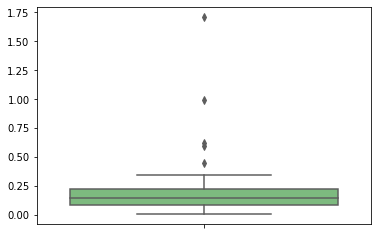

In [ ]:
col_B = ds_merge.filter(regex=('B_*')).columns.values # Obtengo todas las columnas de la categoría B
media_B = np.mean(ds_merge[col_B]) # Calculo la media
sns.boxplot(y=media_B, palette='Greens')

In [ ]:
umbral_B = 0.5
(media_B > umbral_B).value_counts().to_frame(f'Valores mayores a {umbral_B}')

,Valores mayores a 0.5
False,28
True,4


La columna con mas valores que superan el umbral fue B_37


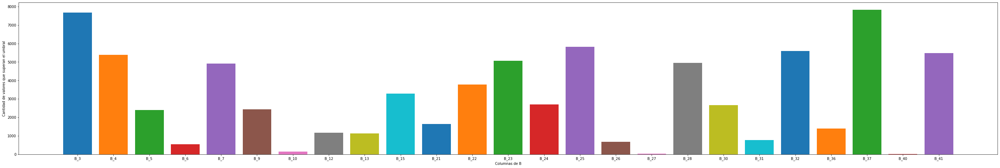

In [ ]:
calc_outliers_zscore(col_B, 'B')

Considerando un umbral de 0.5 para detectar outliers, se observan que solamente 4 superan esta cantidad y como representan un porcentaje menor de la data, también los considaremos outliers.

###### Análisis de outliers para la columna tipo P:

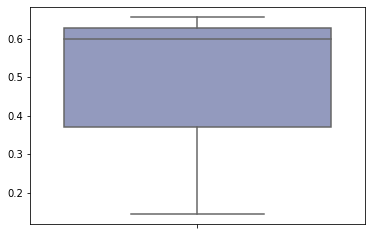

In [ ]:
col_P = ds_merge.filter(regex=('P_*')).columns.values
media_P = np.mean(ds_merge[col_P])
sns.boxplot(y=media_P, palette='BuPu')

En esta columna, a partir del boxplot, no se observan outliers.

La columna con mas valores que superan el umbral fue P_3


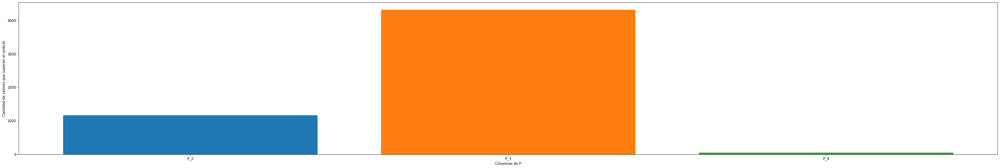

In [ ]:
calc_outliers_zscore(col_P, 'P')

###### Análisis de outliers para la columna tipo S:

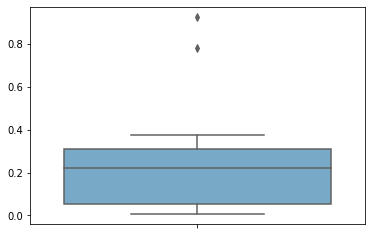

In [ ]:
col_S = ds_merge.filter(regex=('S_*')).columns.values
media_S = np.mean(ds_merge[col_S])
sns.boxplot(y=media_S, palette='Blues')

In [ ]:
umbral_S = 0.7
(media_S > umbral_S).value_counts().to_frame(f'Valores mayores a {umbral_S}')

,Valores mayores a 0.7
False,16
True,2


Partiendo de 0.7, se puede ver que hay dos outliers en esta columna. Nuevamente, como representan un porcentaje menor en la data, los consideramos outliers.

La columna con mas valores que superan el umbral fue S_23


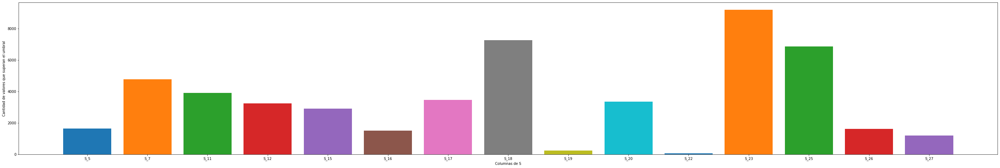

In [ ]:
calc_outliers_zscore(col_S, 'S')

###### Análisis de outliers para la columna tipo R:

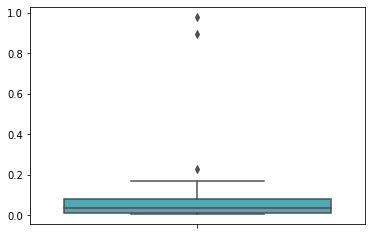

In [ ]:
col_R = ds_merge.filter(regex=('R_*')).columns.values
media_R = np.mean(ds_merge[col_R])
sns.boxplot(y=media_R, palette='YlGnBu')

In [ ]:
umbral_R = 0.2
(media_R > umbral_R).value_counts().to_frame(f'Valores mayores a {umbral_R}')

,Valores mayores a 0.2
False,24
True,3


La columna con mas valores que superan el umbral fue R_10


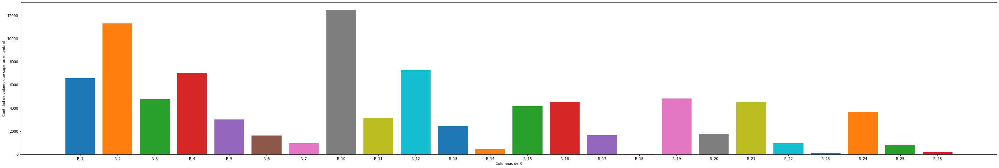

In [ ]:
calc_outliers_zscore(col_R, 'R')

Nuevamente nos encontramos con algunos outliers. Si consideramos el valor 0.2 como umbral para detectar estos outliers, encontramos solamente 3 valores atípicos. Por esta razón, también los consideramos outliers.

Ahora mostramos para cada tipo de variables sus columnas outliers y las guardamos en listas para luego utilizarlas para un analisis.

In [ ]:
print(media_D[media_D > umbral_D])
print(media_B[media_B > umbral_B])
print(media_S[media_S > umbral_S])
print(media_R[media_R > umbral_R])
outliers_D = ['D_68', 'D_117', 'D_126']
outliers_B = ['B_2', 'B_18', 'B_31', 'B_38']
outliers_S = ['S_22', 'S_25']
outliers_R = ['R_12', 'R_13', 'R_27']

D_68     5.051567
D_117    2.506421
D_126    1.744804
dtype: float64
B_2     0.622639
B_18    0.596766
B_31    0.997042
B_38    1.711645
dtype: float64
S_22    0.779978
S_25    0.924648
dtype: float64
R_12    0.979790
R_14    0.227545
R_27    0.893989
dtype: float64


**Conclusion sobre analisis de outliers**  
A partir de los box plots generados, se pudieron observar 12 columnas que tienen valores outliers. Podríamos elegir eliminar estas columnas, pero desprendernos de tantos valores puede llegar a afectar nuestro análisis. Por eso decidimos realizar un analisis de cada una de estas columnas para tomar una decision sobre sus valores.  
Con respecto a los valores de zscore, se pueden observar que varias variables superan el umbral establecido. Al no tener información certera sobre lo que reperesenta el valor de cada variable, optamos por mantenerlas dentro de nuestro dataset ya que podríamos perder informacion que puede ser relevante para nuestro trabajo.   
Ahora continuamos con dicho analisis a partir de las columnas que obtuvimos de los box plots. El objetivo de este es detectar si dentro de estas columnas encontramos valores atipicos que "deformen" la data que representa la columna. Si se encuentran valores de este estilo, procederemos a eliminarlos de la columna.

In [ ]:
# Funcion generica para graficar los box plots de cada columna por separado
def outliers_boxplots(columns, color):
  for col in columns:
    plt.figure()
    boxplot = sns.boxplot(y=ds_merge[col], palette=color)
  
def valores_de_columnas(columns):
  for col in columns:
    print(ds_merge[col].value_counts().to_frame(f"Valores de la columna {col}"))


     Valores de la columna D_68
6.0                      149675
5.0                       60428
3.0                       24311
4.0                       23915
2.0                       10899
1.0                        6541
0.0                         803
     Valores de la columna D_117
0.0                        81819
3.0                        58337
4.0                        56873
2.0                        33365
5.0                        22950
6.0                        17199
1.0                         6029
     Valores de la columna D_126
2.0                       218934
1.0                        44696
0.0                        12942


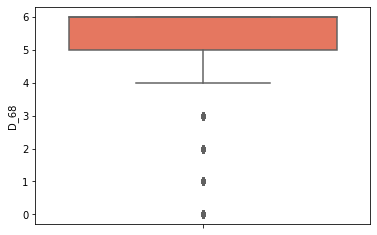

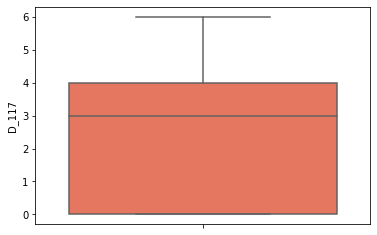

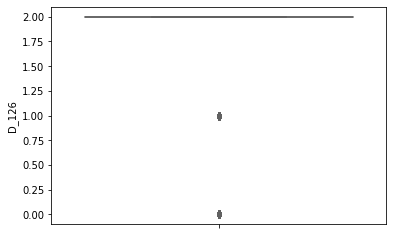

In [ ]:
valores_de_columnas(outliers_D)
outliers_boxplots(outliers_D, 'Reds')

De estas tres columnas no vamos a eliminar nada ya que son parte de las variables categoricas.

          Valores de la columna S_22
0.779978                         924
0.939467                           1
0.967531                           1
0.972185                           1
0.936902                           1
...                              ...
0.937204                           1
0.947985                           1
0.948835                           1
0.956976                           1
0.872319                           1

[275649 rows x 1 columns]
          Valores de la columna S_25
0.924648                         650
0.978863                           1
0.975570                           1
0.970393                           1
0.973236                           1
...                              ...
0.586492                           1
0.974152                           1
0.978145                           1
0.978932                           1
0.975976                           1

[275923 rows x 1 columns]


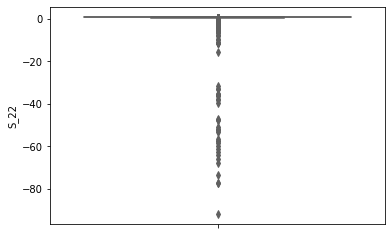

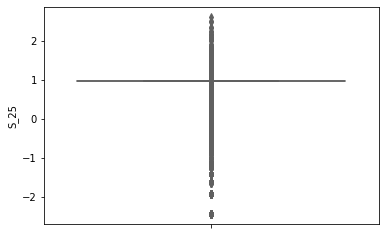

In [ ]:
valores_de_columnas(outliers_S)
outliers_boxplots(outliers_S, 'Blues')

Columna S_22: podemos ver que se repite 924 veces el valor 0.779978.  
Columna S_25: en esta columna, vemos nuevamente un valor repetido varias veces. En este caso el valor 0.924648 se repite 650.  
En ambos casos podríamos tomar como valores atipicos estos que se repiten tantas veces, ya que parece extraño que se repite el mismo valor reiteradas veces. Esto podría estar haciendo que la data que representa la columna se vea deformada.

          Valores de la columna R_12
1.005440                           1
1.009752                           1
1.002678                           1
1.009064                           1
1.003185                           1
...                              ...
1.004793                           1
1.009852                           1
1.008459                           1
1.002329                           1
1.000905                           1

[276572 rows x 1 columns]
          Valores de la columna R_13
0.002608                           1
0.004153                           1
0.001290                           1
0.008758                           1
0.004305                           1
...                              ...
0.008281                           1
0.006745                           1
0.009142                           1
0.003101                           1
0.009067                           1

[276572 rows x 1 columns]
          Valores de la columna R_27
0.893989             

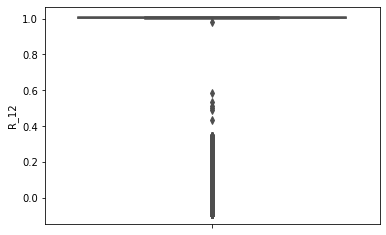

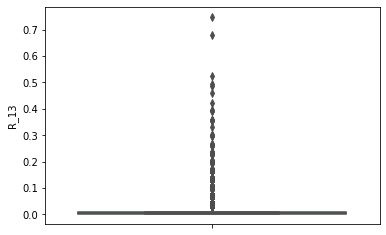

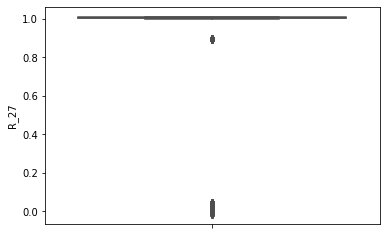

In [ ]:
valores_de_columnas(outliers_R)
outliers_boxplots(outliers_R, 'YlGnBu')

Columas R_12 y R_13: podemos ver que toman varios valores distintos lo que nos hace dificil poder sacar conclusiones sobre estas dos variables.  
Columna R_27: se puede observar que se repite 6457 veces este valor 0.893989. Lo cual podríamos tomar como un caso atípico ya que es raro que se repita tantas veces el mismo valor.

          Valores de la columna B_2
0.622639                        102
1.007497                          1
0.815791                          1
0.819550                          1
1.001610                          1
...                             ...
0.028711                          1
0.066078                          1
0.044896                          1
0.053287                          1
1.003541                          1

[276471 rows x 1 columns]
          Valores de la columna B_18
1.009827                           1
0.204054                           1
0.690743                           1
1.005592                           1
0.411009                           1
...                              ...
1.008992                           1
0.243908                           1
0.238936                           1
0.209765                           1
1.008507                           1

[276572 rows x 1 columns]
   Valores de la columna B_31
1                      275754
0         

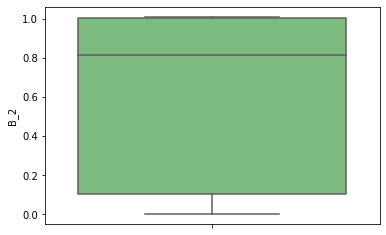

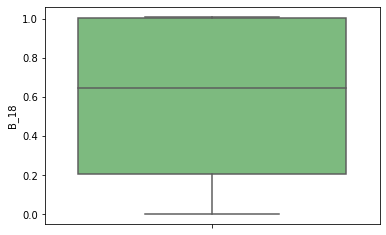

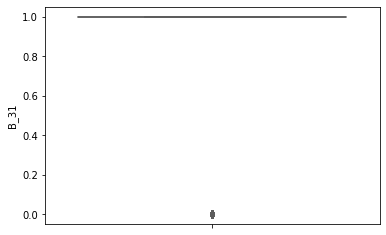

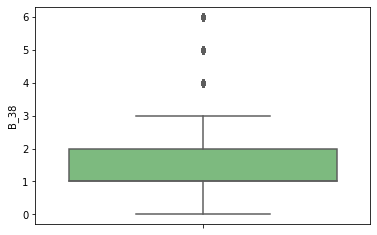

In [ ]:
valores_de_columnas(outliers_B)
outliers_boxplots(outliers_B, 'Greens')

Columna B_31: podemos ver que esta columna solo toma dos valores, 0 y 1. Por lo tanto no lo vamos a considerar como outliers ya que nos pueden llegar a brindar información útil.  
Columna B_38: toma valores de 0 a 5. Tampoco lo vamos a eliminar valores ya que tambien es una variable categorica.  
Columnas B_18 y B_2: no se observan outliers. Por lo tanto, tampoco vamos a considerar esta columna como outlier.

###### Conclusiones del analisis de las columnas outliers

De este analisis podemos concluir que las columnas S_22, S_25 y R_27 tienen un caso en comun. Que en cada una de ellas hay un valor que se repite varias veces mas de lo normal.  
A partir de esto consideramos que estos datos son outliers, ya que pueden estar afectando lo que quiere representar estas columnas. Por este motivo vamos a eliminar estos valores que se repiten reiteradas veces.  

In [ ]:
# Para cada columna obtengo el valor con mas repeticiones.
# Luego se elimina ese valor de la columna y se muestra
# como quedan las columnas si esos valores outliers
def drop_outlier_values(columns):
  for col in columns:
    outlier_value = ds_merge[col].value_counts().index[0]
    ds_merge.drop(ds_merge.index[ds_merge[col] == outlier_value], inplace = True)
    print(ds_merge[col].value_counts().to_frame(f"Valores de la columna {col}"))

drop_outlier_values(['S_22', 'S_25', 'R_27'])

          Valores de la columna S_22
0.939467                           1
0.299113                           1
0.859539                           1
0.884581                           1
0.900664                           1
...                              ...
0.937204                           1
0.947985                           1
0.948835                           1
0.956976                           1
0.872319                           1

[275648 rows x 1 columns]
          Valores de la columna S_25
0.978863                           1
0.978287                           1
0.977866                           1
0.977155                           1
0.974392                           1
...                              ...
0.974152                           1
0.978145                           1
0.978932                           1
0.977334                           1
0.975976                           1

[275021 rows x 1 columns]
          Valores de la columna R_27
1.000421             

##### b. d) Reduccion de dimensionalidad

Teniendo en cuenta la alta cantidad de features del dataset, consideramos que aportaria valor realizar una reduccion de dimensionalidad. Esto reduciria el tamaño del dataset, beneficiandonos por ejemplo, en optimizar los tiempos de entrenamiento de los modelos.

Vamos a utilizar PCA (Principal Component Analysis) ya que en la documentacion oficial de ScikitLearn se recomienda realizar este tipo de metodos por las caracteristicas del dataset en cuestión y no otros como podria ser t-SNE.

Ref.: https://scikit-learn.org/stable/modules/generated/sklearn.manifold.TSNE.html

In [ ]:
ds_best_components = ds_merge.copy()

NameError: ignored

Para este análisis de reduccion de dimensionalidad no vamos a contemplar el poder reducir los siguientes features
*   Customer Id
*   Fecha
*   Target

In [ ]:
ds_best_components = ds_best_components.drop('customer_ID', axis=1)
ds_best_components = ds_best_components.drop('fecha', axis=1)
ds_best_components = ds_best_components.drop('target', axis=1)

NameError: ignored

Pero primero necesitamos estandarizar los datos

In [ ]:
scalar = StandardScaler()
scaled_data = pd.DataFrame(scalar.fit_transform(ds_best_components))

Vamos a utilizar el minimo de componentes para explicar el 95% de la varianza

In [ ]:
pca = PCA(n_components = 0.95)
pca.fit(scaled_data)
data_pca = pca.transform(scaled_data)

In [ ]:
cant_filas, cant_columnas = data_pca.shape
print("Aqui podemos ver que la cantidad de componentes es de:",cant_columnas)

Le asignamos un nombre a cada componente del nuevo dataset.

In [ ]:
component_names = ['PC%i' % i for i in range(cant_columnas)]
data_pca = pd.DataFrame(data_pca, columns = component_names)

Y ahora volvemos a agregar las columnas Customer Id, Fecha y Target a nuestro dataset reducido dimensionalmente.

In [ ]:
data_pca['customer_ID'] = ds_merge['customer_ID'].values
data_pca['fecha'] = ds_merge['fecha'].values
data_pca['target'] = ds_merge['target'].values

first_column = data_pca.pop('customer_ID')
second_column = data_pca.pop('fecha')
third_column = data_pca.pop('target')

data_pca.insert(0, 'customer_ID', first_column)
data_pca.insert(1, 'fecha', second_column)
data_pca.insert(2, 'target', third_column)

ds_merge_reduced = data_pca.copy()

Y vemos como queda finalmente.

In [ ]:
ds_merge_reduced.head(5)

##### b. e) Determinar si es necesario normalizar o unificar valores en alguna columna

Consideramos que si es necesario realizar una normalizacion de datos, la misma fue aplicada previo al analisis de componentes principales (PCA) ya que es un requisito.

Respecto a la unificación de valores, no realizamos ninguna ya que al no saber precisamente que informacion contiene cada columna no podemos determinar si sus valores pueden ser combinados.

##### b. f) Balancear el conjunto de datos.



Vamos a comprobar si el dataset se encuentra desbalanceado, verificando los valores de la variable 'target'.

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


0    202373
1     66240
Name: target, dtype: int64

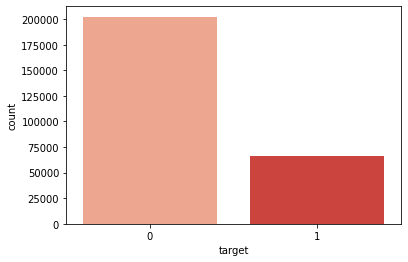

In [ ]:
values = sns.countplot(ds_merge_reduced['target'], palette='Reds')
ds_merge_reduced.target.value_counts()

Como método de balanceo, decidimos hacer subsampling, o sea eliminar registros de la categoría que tenga mayoría. Decidimos usar este método porque consideramos que el dataset es muy grande, y luego de eliminar algunos registros igual contaremos con una cantidad apropiada para entrenar los modelos. Procederemos a remover filas con target = 0 para obtener un dataset balanceado.

In [ ]:
zero_target_values , one_target_values = ds_merge_reduced.target.value_counts()
total = zero_target_values + one_target_values

percentage_zero = int ((zero_target_values * 100) / total)
percentage_one = int ((one_target_values * 100) / total)
print("Como podemos ver hay: ")
print(str (percentage_zero) + " % de valores con 0.")
print(str (percentage_one) + " % de valores con 1.")

Como podemos ver hay: 
75 % de valores con 0.
24 % de valores con 1.


In [ ]:
#Cantidad de columnas a remover para que el dataset quede balanceado.
quantity_to_remove = zero_target_values - one_target_values

#Array de indices de filas donde el target = 0.
zero_values_indexes = ds_merge_reduced.index[ds_merge_reduced['target'] == 0].tolist()
count = 0
indexes_to_delete = []

for value in zero_values_indexes:
  #Array de indices a eliminar.
  indexes_to_delete.append(value)
  count += 1
  #Si llego a la cantidad necesaria termino.
  if (count == quantity_to_remove):
    break

#Elimino las filas del dataset.
ds_merge_reduced = ds_merge_reduced.drop(ds_merge_reduced.index[indexes_to_delete])

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


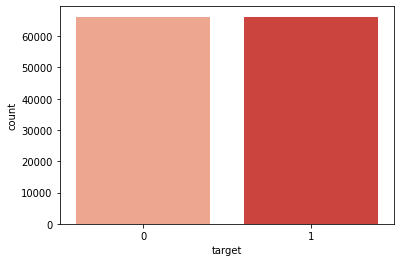

In [ ]:
sns.countplot(ds_merge_reduced['target'], palette='Reds')

Como se puede ver, ahora el dataset tiene la misma cantidad de datos con target 0 y 1.

In [ ]:
ds_merge_reduced.reset_index(inplace=True, drop=True)
print('Cantidad de filas:', ds_merge_reduced.shape[0])

Cantidad de filas: 132480


Vemos que, como mencionamos antes, seguimos teniendo un dataset de muchas filas luego de balancearlo.

#### c) Descripción de los datos:

El dataset quedó de la siguiente forma:

In [ ]:
ds_merge_reduced.head(10)

,customer_ID,fecha,target,PC0,PC1,PC2,PC3,PC4,PC5,PC6,...,PC98,PC99,PC100,PC101,PC102,PC103,PC104,PC105,PC106,PC107
0,00013181a0c5fc8f1ea38cd2b90fe8ad2fa8cad9d9f13e...,230.0,1,2.805590,-0.731202,-1.556530,-2.024675,1.544583,1.392861,3.614962,...,-0.003833,-0.064891,-0.027713,0.973670,1.273775,0.383145,0.498931,0.409675,-0.505178,0.689168
1,0001812036f1558332e5c0880ecbad70b13a6f28ab04a8...,26.0,1,6.434285,-1.021543,-1.902621,3.121995,0.911329,-0.146828,-1.152826,...,-0.583197,-0.988987,-0.623524,1.204366,2.053489,-0.744382,-0.686316,0.016990,-1.211514,0.597147
2,00039533fe0b61bcf1ec0d1aefe6acb5469ea0f0d1b0ad...,266.0,1,7.550538,1.043031,-2.770942,-1.532509,-2.541114,-1.225174,0.090627,...,0.332994,0.287807,0.250624,-0.643027,0.159816,-0.314795,-0.155887,0.421602,-0.827465,-1.306160
3,000473eb907b57c8c23f652bba40f87fe7261273dda470...,160.0,1,7.946513,-0.382785,-3.699913,1.525590,-1.333071,-2.370367,-0.415474,...,-0.150792,0.766171,0.101587,-0.442513,0.007856,-0.193143,-0.122213,0.732724,0.332652,0.261870
4,0008c2f297e1b00bf567c0d2c25f3e3b356f9a3088d2bf...,14.0,1,6.214520,2.120009,-3.065698,-1.729378,-0.305104,-3.709457,-1.122480,...,0.289390,-0.406595,-0.391462,-0.005431,-0.121500,-0.608235,0.719293,0.203105,0.099895,-1.428884
5,000bbcea7cf6a9d74b2ff2f6fd4fa89a4ff4c419a8b569...,198.0,1,4.422726,-6.953637,3.403391,1.809278,2.989379,4.881447,-0.077870,...,-0.502183,-0.962677,-0.047979,0.987971,0.345953,-1.348306,-0.052848,1.080353,-0.637503,0.283597
6,000bbcea7cf6a9d74b2ff2f6fd4fa89a4ff4c419a8b569...,227.0,1,2.569619,-5.883769,1.586280,2.595373,2.682117,2.557378,-0.103926,...,-0.674292,-0.582542,-0.032741,0.474773,0.609917,-1.397485,0.087056,0.372832,0.136096,0.094088
7,000cc98607442c5074d368870a7fa3cb1634147af647f1...,195.0,1,5.060105,-2.724833,-0.954870,1.715287,-1.774369,-2.259232,0.117634,...,-1.124006,0.603309,0.301109,-0.327277,0.559617,-0.088566,-0.678568,-0.226853,-0.186449,-0.217181
8,000f1c950ae4e388f44e9ba96dd6334dfa85d8be0416d9...,330.0,1,-1.659927,-3.394592,-0.343693,-1.746359,0.152399,2.000760,1.719674,...,0.200620,-0.102991,-0.026292,0.012547,0.144048,-0.120664,-1.019506,0.237950,-0.196121,0.246229
9,00115d9ba7650295cdfc73537fe5efad4f3de6838064ce...,40.0,1,3.076106,-0.137655,-0.646550,1.292657,5.671626,1.584506,2.336064,...,-0.563877,0.101204,-0.043053,-0.045005,-0.038085,-0.130084,0.340575,-0.355008,-0.609112,-0.045529


In [ ]:
print('Cantidad de filas:', ds_merge_reduced.shape[0])
print('Cantidad de columnas:', ds_merge_reduced.shape[1])

Cantidad de filas: 132480
Cantidad de columnas: 111


Los datos tenían varias columnas con muchos datos nulos, algunas hasta con 99% de nulos, todas las que tenían un porcentaje de nulos mayor a 40% ya que, analizando los heatmaps, esas variables no tenían mucha correlación la target entonces nos pareció que la eliminación no iba a afectar tanto como por ahí si podía afectar una imputación a una columna con la mitad de datos faltantes.

Del dataset pudimos descubrir que la variable S_2 es la fecha de la operación, que todas las operaciones se realizaron entre marzo del 2017 y marzo del 2018.
Vimos que las variables de las categorías S y R son las menos correlacionadas con la variable target, mientras que en algunas pocas de las categorías D y B es donde encontramos una correlación un poco más alta con target, aunque nunca esas correlaciones superan el valor 0.6, por lo que siempre nos mantenemos en valores relativamente bajos. No hay ninguna que marque una gran diferencia y que veamos que podría llegar a ser decisiva a la hora de predecir. 

Las métricas que usaremos para medir el desempeño de los modelos serán: presición, recall y f1. Utilizaremos también la matriz de confusión y la curva ROC y el área debajo de esta curva (AUC).

La precisión es la cantidad de predicciones correctas que hizo el modelo sobre todas las predicciones que realizó como verdaderas (sean o no verdaderas en realidad). Con esto podemos medir la calidad del modelo de machine learning en tareas de clasificación.

El recall es el número de elementos identificados correctamente como positivos del total de positivos verdaderos. 

El valor F1 se utiliza para combinar las medidas de precision y recall en un sólo valor. F1 asume que nos importa de igual forma la precisión y el recall.

La matriz de confusión es una herramienta que permite la visualización del desempeño de un modelo de clasificación. En particular, sirve para mostrar de forma explícita cuándo una clase es confundida con otra, lo cual nos, permite trabajar de forma separada con distintos tipos de error.

### 2. Generación y evaluación de modelos

#### a) Modelos

Hemos optado por partir el conjunto en un set de entrenamiento y otro de prueba para entrenar los modelos. Decidimos dividir los datos 70/30, 70% para entrenamiento y 30% para prueba.

Comenzaremos haciendo esa división.

In [ ]:
seed = 7
ds_y = ds_merge_reduced['target'].copy()
ds_x = ds_merge_reduced.drop(['customer_ID', 'target'], axis=1) # Saco el customer_ID ya que no es un dato a tener en cuenta al entrenar
x_train, x_test, y_train, y_test = train_test_split(ds_x, ds_y, test_size=0.3, random_state=seed)

NameError: ignored

Definimos funciones que serán útiles para visualizar las métricas de cada modelo entrenado a continuación:

In [ ]:
def get_metrics(y_test, y_pred, model):
  f1 = f1_score(y_test, y_pred)
  precision = precision_score(y_test, y_pred)
  recall = recall_score(y_test, y_pred)
  auc = roc_auc_score(y_test, y_pred)
  print('Metricas para ' + model )
  print('f1: ', f1)
  print('recall: ', recall)
  print('precision: ', precision)
  print('AUC: ', auc)

In [ ]:
def get_roc_curve(y_test, prob, model):
  prob = prob[:, 1]
  fper, tper, thresholds = roc_curve(y_test, prob)
  plt.plot(fper, tper, color='red', label='ROC')
  plt.plot([0, 1], [0, 1], color='green', linestyle='--')
  plt.xlabel('False Positive Rate')
  plt.ylabel('True Positive Rate')
  plt.title('ROC de ' + model)
  plt.legend()
  plt.show()

In [ ]:
def get_conf_matrix(y_test, y_pred, model):
  cm = confusion_matrix(y_test, y_pred)
  sns.heatmap(cm, cmap='Blues', annot=True, fmt='g')
  plt.title('Matriz de Confusión del modelo ' + model)
  plt.xlabel('Predicted')
  plt.ylabel('True')
  plt.show()

##### i. Random Forest

Random Forest es un método de clasificación que utiliza muchos árboles (por eso forest=bosque) para predecir. La idea es que cada árbol por separado es un estimador mediocre, pero promediados pueden ser muy buenos. Es un método de ensamble.

Comenzamos buscando los hiperparámetros óptimos para entrenar este modelo. La optimización de hiperparámetros se realiza normalmente mediante la utilización de un proceso de búsqueda cuyo objetivo consiste en encontrar la mejor selección de valores para un conjunto finito de hiperparámetros con el objetivo de generar el mejor modelo posible.

En este caso utilizaremos el Random Search, ésta es un proceso de búsqueda de tipo aleatorio sobre un espacio de búsqueda finito. El proceso de búsqueda aleatoria consiste en generar nuevas configuraciones de hiperparámetros mediante la modificación aleatoria de una de las soluciones previamente generadas dentro del espacio de búsqueda, quedándote con la mejor. 

No nos asegura encontrar la más óptima como el Grid Search que explora todas las combinaciones posibles de configuraciones pero éste último suele consumir muchos recursos y nuestro dataset es muy grande por lo que optamos por el random search.

In [ ]:
rfc = RandomForestClassifier()
n = 10
params_grid = {'criterion':['gini','entropy'],
                'min_samples_leaf': [45, 50, 55, 100],
                'max_features':['sqrt', 'log2'],
                'min_samples_split': [40, 50, 60, 80, 100],
                'ccp_alpha': np.linspace(0, 0.05,n),
                'n_estimators': [60, 70, 100, 120],
                'max_depth' : list(range(85, 100))
               } 

folds = 5
kfoldcv = StratifiedKFold(n_splits=folds)
scorer_fn = make_scorer(sk.metrics.f1_score)

randomcv = RandomizedSearchCV(estimator=rfc,
                              param_distributions = params_grid,
                              scoring=scorer_fn,
                              cv=kfoldcv,
                              n_iter=n,
                              error_score='raise',
                              random_state=seed) 

In [ ]:
model_rforest = randomcv.fit(X = x_train, y = y_train)

KeyboardInterrupt: ignored

In [ ]:
#Mejores hiperparametros del random forest
print(randomcv.best_params_)
#Mejor métrica
print(randomcv.best_score_)

Vemos cuales son los valores elegidos y vemos que esos parámetros dan un score de 0.86 (utilizando la métrica f1 score), el cual es el más alto que logramos conseguir al ir cambiando los rangos de cada hiperparámetro.

Teniendo ya los hiperparámetros, pasamos a entrenar el modelo.

In [ ]:
rfc = RandomForestClassifier().set_params(**randomcv.best_params_)
model_rfc = rfc.fit(X = x_train, y = y_train)

Guardamos el modelo en un archivo para poder utilizarlo luego sin necesidad de entrenarlo nuevamente.

In [ ]:
## Esto se realiza cada vez que se quiera actualizar el entrenamiento.
## En la seccion de 'Librerias y datasets' ya se encuentra uno descargado.

is_model_saved = os.path.isfile("./random_forest_job.joblib")
if (is_model_saved == False):
  joblib.dump(model_rfc, "./random_forest_job.joblib")

Cargamos el modelo

In [ ]:
model_rfc = joblib.load("./random_forest_job.joblib")

Luego predecimos y calculamos las métricas:

In [ ]:
y_pred_rfc = model_rfc.predict(x_test)
get_metrics(y_test, y_pred_rfc, 'Random Forest')

Vemos que las métricas son bastante buenas. La precisión nos dice que el 80% de los casos que son 0 (no hubo incumplimiento de pago) los predice correctamente. O sea que el 20% de los casos que prediga como no incumplimiento, serán en realidad incumplimientos.

Por otro lado, el recall nos dice que del total de no incumplimientos, el modelo puede identificar un 91% de esos casos. Esto es muy bueno ya que eso es lo que estamos tratando de predecir, si un cliente va o no a defaultear el pago.

In [ ]:
prob = model_rfc.predict_proba(x_test)
get_roc_curve(y_test, prob, 'Random Forest')

In [ ]:
get_conf_matrix(y_test, y_pred_rfc, 'Random Forest')

Vemos que el modelo tiene en su mayoría buenas predicciones (15671 true positive y 18157 true negative), vemos que se confunde mucho más prediciendo 0 como 1 que 1 como 0. O sea que tiene más false positive que false negative. Es por esto que el recall es más alto que la precisión (0.91 el recall y 0.80 la precisión).

##### ii. xGBoost

El xGBoost (eXtreme Gradient Boost) es un modelo de ensamble construído con la técnica boosting: esta técnica entrena los modelos del ensamble en forma secuencial. Cada modelo se entrena centrado en los errores que tuvo el modelo anterior a él. De esta forma, se van refinando los errores cometidos por cada predictor.

Para el caso de xGBoost tambien utilizaremos la busqueda de hiperparametros mediante Random Search, pero con los siguientes parametros

*  learning_rate: Tasa de aprendizaje.
*  max_depth: Máxima profundidad de cada árbol.
*  subsample: Porcentaje de muestras usadas para cada árbol.
*  colsample_bytree: Porcentaje de features usadas para cada árbol.
*  n_estimators: Cantidad de árboles a construir.
*  objective: función de error a utilizar (Usamos binary:logistic ya que es recomendado para problemas de clasificación)

Adicionalmente aplicamos un StratifiedKFold dado a que se trata de un problema de clasificacion y nos ayuda garantizar que cada iteracion del conjunto de datos tenga la misma proporción de observaciones, lo que notamos que ayudo a mejorar los tiempos de entrenamiento.

In [ ]:
learning_rate = [0.06, 0.08]
max_depth = [3, 5]
subsample = [0.5, 0.6]
colsample_bytree = [0.5, 1.0]
n_estimators = [100, 150]
gamma = [0.8, 1]

param_distributions = dict(
    colsample_bytree = colsample_bytree,
    gamma = gamma,
    learning_rate = learning_rate,
    subsample = subsample,
    n_estimators = n_estimators,
    max_depth = max_depth,
)

skf = StratifiedKFold(n_splits=3, shuffle = True, random_state = 7)
xgb_initial = xgb.XGBClassifier(random_state = seed, objective= 'binary:logistic')

xgb_random_search = RandomizedSearchCV(xgb_initial, param_distributions=param_distributions, n_iter=3, scoring='roc_auc', n_jobs=4, cv=skf.split(x_train,y_train), verbose=3, random_state=7 )

In [ ]:
best_xgb_model = xgb_random_search.fit(x_train, y_train)

In [ ]:
#Mejores hiperparametros del xGBoost
print(best_xgb_model.best_params_)
#Mejor métrica
print(best_xgb_model.best_score_)

In [ ]:
xgb_best_model = xgb.XGBClassifier().set_params(**best_xgb_model.best_params_)
xgb_classifier = xgb_best_model.fit(X = x_train, y = y_train)

In [ ]:
## Esto se realiza cada vez que se quiera actualizar el entrenamiento.
## En la seccion de 'Librerias y datasets' ya se encuentra uno descargado.

is_model_saved = os.path.isfile("./xgboost_job.joblib")
if (is_model_saved == False):
  joblib.dump(xgb_classifier, "./xgboost_job.joblib")

In [ ]:
xgb_classifier = joblib.load("./xgboost_job.joblib")

In [ ]:
y_pred_xgb = xgb_classifier.predict(x_test)
get_metrics(y_test, y_pred_xgb, 'XGBoost')

Vemos que en este caso las métricas también son buenas, parecidas a las del random forest.

In [ ]:
prob = xgb_classifier.predict_proba(x_test)
get_roc_curve(y_test, prob, 'XGBoost')

In [ ]:
get_conf_matrix(y_test, y_pred_xgb, 'XGBoost')

La matriz de confusión es bastante parecida a la del random forest, acá también tiene más false positive que false negative.

##### iii. SVM

Para este modelo, en principio intentamos utilizando el modelo SVC que nos otorga
la libreria sklearn. Despues de varios intentos y corriendo el modelo por mas de
dos horas no logramos que termine.  
Investigando un poco acerca de SVC encontramos que en la documentacion de sklearn
dice que no recomienda utilizar este modelo para grandes volumenes de datos.

> *For large datasets consider using LinearSVC or SGDClassifier instead.*  
[Doc SVC](https://scikit-learn.org/stable/modules/generated/sklearn.svm.SVC.html)

Es por este motivo que optamos utilizar el modelo LinearSVC para nuestro trabajo
practico.


Buscamos hiperparámetros:

In [ ]:
n = 10
svm = LinearSVC()
params_svm = {
    'C': [0.0001, 0.001, 0.01, 0.1, 1, 10, 100, 1000],
    'class_weight': ['balanced', None],
    'dual':[False]
}

folds = 5
kfoldcv = StratifiedKFold(n_splits=folds)
scorer_fn = make_scorer(sk.metrics.f1_score)

randomcv_svm = RandomizedSearchCV(estimator=svm,
                              param_distributions = params_svm,
                              scoring=scorer_fn,
                              cv=kfoldcv,
                              n_iter=n,
                              error_score='raise',
                              random_state=seed)

In [ ]:
model_svm = randomcv_svm.fit(X = x_train, y = y_train)

In [ ]:
print(f"Mejores parametros: {randomcv_svm.best_params_}\nMejor score: {randomcv_svm.best_score_}")

In [ ]:
svm = LinearSVC().set_params(**randomcv_svm.best_params_)
model_svm = svm.fit(X = x_train, y = y_train)

In [ ]:
is_model_saved = os.path.isfile("./svm_job.joblib")
if (is_model_saved == False):
  joblib.dump(model_svm, "./svm_job.joblib")

In [ ]:
model_svm = joblib.load("./svm_job.joblib")

Predecimos

In [ ]:
y_pred_svm = model_svm.predict(x_test)

In [ ]:
get_metrics(y_test, y_pred_svm, 'SVM')

Vemos que las métricas también son buenas. En este caso el recall es un poco más bajo que los anteriores, las demás métricas siguen siendo parecidas.

In [ ]:
get_conf_matrix(y_test, y_pred_svm, 'SVM')

Elegimos dos modelos más para probar: regresión logística y árbol de decisión.

##### iv. Regresión Logística

La regresión logística es un método estadístico que trata de modelar la probabilidad de una variable binaria (solo dos posibles valores) en función de una o más variables independientes.

Primero entrenamos el modelo.

In [ ]:
reg_log = LogisticRegression(max_iter=2000).fit(x_train, y_train)

Lo guardamos para poder usarlo luego.

In [ ]:
is_model_saved = os.path.isfile("./regresion_job.joblib")
if (is_model_saved == False):
  joblib.dump(reg_log, "./regresion_job.joblib")

In [ ]:
reg_log = joblib.load("./regresion_job.joblib")

Pasamos a predecir y luego a calcular las métricas.

In [ ]:
y_pred_reg = reg_log.predict(x_test)

In [ ]:
get_metrics(y_test, y_pred_reg, 'regresión logística')

Es uno de los métodos más básicos asique es normal que tenga métricas no tan buenas como los modelos anteriores, aunque en este caso no se alejan tanto.

Graficamos la curva ROC:

In [ ]:
prob = reg_log.predict_proba(x_test)
get_roc_curve(y_test, prob, 'regresión logística')

Finalmente, vemos la matriz de confusión del modelo

In [ ]:
get_conf_matrix(y_test, y_pred_reg, 'regresión logística')

Vemos que predice mayormente de forma correcta, y acá también podemos ver que los false positive son mayores a los false negative, aunque no hay una diferencia muy grande como por ahí sí tienen los modelos anteriores, ya que este modelo está teniendo más false negative (alrededor de mil más) que los demás modelos.

##### v. Árbol de Decisión.

Comenzamos buscando los mejores hiperparámetros para entrenar el modelo

In [ ]:
n = 10
params_grid = {'criterion':['gini','entropy'],
                'min_samples_leaf': [240, 250, 260, 270],
                'min_samples_split': [140, 130, 150, 160],
                'ccp_alpha': np.linspace(0, 0.05,n),
                'max_depth' : [3, 5, 10, 20, 40, 50]
} 
folds = 5
kfoldcv = StratifiedKFold(n_splits=folds)
scorer_fn = make_scorer(sk.metrics.f1_score)
dtc = DecisionTreeClassifier() 

tree_randomcv = RandomizedSearchCV(estimator=dtc,
                              param_distributions = params_grid,
                              scoring=scorer_fn,
                              cv=kfoldcv,
                              n_iter=n,
                              error_score='raise',
                              random_state=seed) 

In [ ]:
tree_randomcv.fit(x_train, y_train)

In [ ]:
#Mejores hiperparametros del árbol
print(tree_randomcv.best_params_)
#Mejor métrica
print(tree_randomcv.best_score_)

In [ ]:
tree_model = DecisionTreeClassifier().set_params(**tree_randomcv.best_params_)

tree_model.fit(x_train, y_train)

Guardamos el árbol:

In [ ]:
is_model_saved = os.path.isfile("./tree_job.joblib")
if (is_model_saved == False):
  joblib.dump(tree_model, "./tree_job.joblib")

In [ ]:
tree_model = joblib.load("./tree_job.joblib")

In [ ]:
print(f"Profundidad del árbol: {tree_model.get_depth()}")
print(f"Número de nodos terminales: {tree_model.get_n_leaves()}")

Utilizamos la función definida previamente para observar las métricas del modelo

In [ ]:
tree_pred = tree_model.predict(X = x_test)
get_metrics(y_test, tree_pred, 'Árbol de decisión')

Vemos que las métricas son buenas también.

In [ ]:
get_conf_matrix(y_test, tree_pred, 'Árbol de decisión')

Podemos ver según los resultados, que las métricas se encuentran dentro de un rango aceptable ya que son más los casos en los que predice bien que los casos en que da un resultado erróneo.

#### b) Ensamble de modelos



Los modelos ensamblados son muchos predictores mediocres los cuales juntos son suelen ser mejores a la hora de predecir. Se lo llama conocimiento colectivo.

Crearemos un ensamble con los 5 modelos anteriores: random forest, XGBoost, SVM, regresión logística y árbol de decisión. El ensamble será híbrido (se entrenan distintos modelos) de tipo Voting: se construyen N modelos utilizando los mismos datos y luego toma la predicción mayoritaria como la definitiva.

In [ ]:
# Creo el ensamble de tipo Voting con los modelos del punto anterior
ensamble = VotingClassifier(estimators = [('lr', reg_log), ('rnd', model_rfc), ('xgb', xgb_classifier), ('tree', tree_model), ('svm', model_svm)], voting = 'hard')

El hiperparámetro voting establece el tipo de votación que se realizará. Elegimos usar el 'hard' que elige la clase ganadora por regla de la mayoría. La clase que es elegida por la mayoría de los modelos es la ganadora.

Pasamos a entrenar el modelo.

In [ ]:
ensamble_model = ensamble.fit(x_train, y_train)

Guardamos el ensamble

In [ ]:
is_model_saved = os.path.isfile("./ensamble_voting.joblib")
if (is_model_saved == False):
  joblib.dump(ensamble_model, "./ensamble_voting.joblib")

In [ ]:
ensamble_model = joblib.load("./ensamble_voting.joblib")

Predecimos y luego vemos las métricas:

In [ ]:
y_pred_ensamble = ensamble_model.predict(x_test)

In [ ]:
get_metrics(y_test, y_pred_ensamble, 'Ensamble tipo Voting')

Vemos que las métricas son buenas al igual que con los modelos anteriores. La precisión sigue siendo la métrica más baja y el recall la más alta.

In [ ]:
get_conf_matrix(y_test, y_pred_ensamble, 'Ensamble tipo Voting')

Vemos lo mismo que en las anteriores, hay bastantes más false positive que false negative, por eso la diferencia entre recall y precisión.

#### c) Redes Neuronales

In [ ]:
cols_predictoras = ds_merge_reduced.columns.to_list()
cols_predictoras.remove('target')
cols_predictoras.remove('customer_ID')

cant_cols = len(cols_predictoras)

Creamos la red neuronal, elegimos para las capas de entrada usar la función de activación relu y para la intermedia y la de salida la función sigmoid. La función de pérdida que usamos es sparse categorical crossentropy y elegimos utilizar el optimizador Adam.

In [ ]:
red_model = keras.Sequential([
    keras.layers.Dense(cant_cols/4, input_shape=(cant_cols,), activation='relu'),
    keras.layers.Dense(cant_cols/8, activation='sigmoid'),
    keras.layers.Dense(2, activation="softmax")
])

red_model.compile(
  optimizer = keras.optimizers.Adam(0.001, beta_1=0.9, beta_2=0.999), 
  loss = 'sparse_categorical_crossentropy', 
  metrics = ['accuracy']
)

In [ ]:
red_model.fit(x_train,y_train,epochs=100,batch_size=10,verbose=False)

In [ ]:
y_pred_red = red_model.predict(x_test)

y_pred_red = np.argmax(y_pred_red,axis = 1)

get_metrics(y_test, y_pred_red, 'Red neuronal')

NameError: ignored

Guardamos la Red Neuronal

In [ ]:
is_model_saved = os.path.isfile("./neural_net.joblib")
if (is_model_saved == False):
  joblib.dump(red_model, "./neural_net.joblib")

In [ ]:
red_model = joblib.load("./neural_net.joblib")

Vemos que las métricas de la red son muy buenas pero no son tanto más buenas que las de los demás modelos ya que las métricas de éstos son también son muy buenas, probamos varias redes: con dos capas intermedias, variando las funciones de activación, el learning rate, la función de pérdida, entre varias cosas más y estas fueron las mejores métricas que logramos obtener. Aunque cabe destacar que siempre obtuvimos métricas bastante parecidas a estas, eran todas buenas, pero estábamos intentando superar los modelos anteriores.

Decidimos quedarnos con esta que si bien no supera ampliamente a los demás modelos, los iguala es apenas mejor.

In [ ]:
get_conf_matrix(y_test, y_pred_red, 'Red neuronal')

#### d) Ensamble en cascada

El cascading (cascada) es un enfoque en el que se pasa sucesivamente los datos de un modelo a otro, justamente como una cascada. Cada capa tiene un solo modelo y el input de cada modelo son las instancias predichas con poca certeza en el modelo anterior.

El primer modelo que vamos a usar es la red neuronal del punto anterior.

Definimos las siguientes funciones que utilizaremos en las diferentes instancias del ensamble en cascada. Las mismas se encargan de identificar los valores predichos correctamente para ir depurando el dataset en cada predicción.

In [ ]:
def filter(ds):
  rows_to_filter = ds[ds['y_pred'] == ds['y_test']]
  return rows_to_filter

def get_new_ds(ds, ds_original):
  return ds_original.iloc[list(filter(ds).index)]

In [ ]:
# Red Neuronal
y_pred_red = red_model.predict(x_test)
y_pred_train_red = red_model.predict(x_train)
y_pred_red = np.argmax(y_pred_red,axis = 1)
y_pred_train_red = np.argmax(y_pred_train_red, axis=1)

print('Tamaño dataset para Red', ds_merge_reduced.shape[0])

#Metricas
get_metrics(y_test, y_pred_red, 'Test Red Neuronal')
get_metrics(y_train, y_pred_train_red, 'Train Red Neuronal')


x_train['y_pred'] = y_pred_train_red
x_train['y_test'] = y_train
    
x_test['y_pred'] = y_pred_red
x_test['y_test'] = y_test

ds_filtered = pd.concat([get_new_ds(x_train, ds_merge_reduced), get_new_ds(x_test, ds_merge_reduced)] )

ds_x = ds_filtered.drop(['target', 'customer_ID'], axis=1)
ds_y = ds_filtered['target']


x_train, x_test, y_train, y_test = train_test_split(ds_x, ds_y, test_size = 0.3, random_state = seed)

In [ ]:
print('Tamaño dataset para Arbol', ds_filtered.shape[0])

In [ ]:
# Arbol Binario
tree_model.fit(x_train, y_train)

y_pred_ab = tree_model.predict(x_test)
y_pred_train_ab = tree_model.predict(x_train)

#Metricas
get_metrics(y_test, y_pred_ab, 'Test de Arbol Binario')
get_metrics(y_train, y_pred_train_ab, 'Train de Arbol Binario')

x_train['y_pred'] = y_pred_train_ab
x_train['y_test'] = y_train
    
x_test['y_pred'] = y_pred_ab
x_test['y_test'] = y_test

ds_filtered = pd.concat([get_new_ds(x_train, ds_merge_reduced), get_new_ds(x_test, ds_merge_reduced)] )

ds_x = ds_filtered.drop(['target', 'customer_ID'], axis=1)
ds_y = ds_filtered['target']

x_train, x_test, y_train, y_test = train_test_split(ds_x, ds_y, test_size = 0.3, random_state = seed)

El árbol da muy buenas métricas, mucho mejores de las que da prediciendo solo.

In [ ]:
print('Tamaño dataset para XGBoost', ds_filtered.shape[0])

In [ ]:
# xGBOOST
xgb_classifier.fit(x_train, y_train)

y_pred_xgb = xgb_classifier.predict(x_test)
y_pred_train_xgb = xgb_classifier.predict(x_train)

#Metricas
get_metrics(y_test, y_pred_xgb, 'Test de xGBOOST')
get_metrics(y_train, y_pred_train_xgb, 'Train de xGBOOST')

El XGBoost da también muy buenas métricas para los valores que faltan, decidimos que con estos resultados es suficiente y nos quedamos con estos 3 modelos en el ensamble.

### 3. Conclusiones

El dataset nos resultó difícil de trabajar ya que los nombres de las columnas no aportan información sobre sus valores. Pese a eso, analizando correlaciones entre columnas pudimos realizar una limpieza y mejora del dataset que nos permitió obtener buenas métricas en la mayoría de los modelos entrenados.  
No hay un método que destaque por sobre los demás, pero nos parece que el ensamble cascading es el mejor.  

El ensamble cascading consigue ir mejorando las predicciones a medida que pasa por los modelos, como el xgBoost se equivoca poco (lo vemos en las métricas), van a quedar muy pocos datos mal clasificados ya que éste recibió los datos mal clasificados por los métodos anteriores. No nos parece necesario una mejora del método ya que las métricas finales son muy altas.

Por último, debido a la correlación superior de las siguientes variables con el target en comparación con el resto, consideramos que podrían ser variables determinantes al momento de decidir si se realizará o no el pago de la tarjeta.

*   D_48 con un valor de 0.55
*   D_61 con un valor de 0.49
*   B_9 con un valor de 0.48
*   D_44 con un valor de 0.47




